In [2]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import os
from matrices import *
from main import *

FIGURE_WIDTH_1COL = 3.404  # For PRX style, change for according to journal
FIGURE_WIDTH_2COL = 7.057  # For PRX style, change for according to journal
FIGURE_HEIGHT_1COL_GR = FIGURE_WIDTH_1COL*2/(1 + np.sqrt(5))
FIGURE_HEIGHT_2COL_GR = FIGURE_WIDTH_2COL*2/(1 + np.sqrt(5))

font_size = 6 # For PRX style, change for according to journal

plt.rcParams.update({
    'font.size'           : font_size,  
    'figure.titlesize'    : 'medium',
    'figure.dpi'          : 1000, # 1000
    'figure.figsize'      : (FIGURE_WIDTH_1COL, FIGURE_HEIGHT_1COL_GR),
    'axes.titlesize'      : 'medium',
    'axes.axisbelow'      : True,
    'xtick.direction'     : 'in',
    'xtick.labelsize'     : 'small',
    'ytick.direction'     : 'in',
    'ytick.labelsize'     : 'small',
    'image.interpolation' : 'none',
    'legend.fontsize'     : font_size,
    'axes.labelsize'      : font_size,
    'axes.titlesize'      : font_size,
    'xtick.labelsize'     : font_size,
    'ytick.labelsize'     : font_size,
})


plt.rcParams.update({'font.family':'sans-serif'})

cwd = os.getcwd()
print(cwd)


# Set the 'axes.grid' parameter to True globally
plt.rcParams['axes.grid'] = True

assist = {"x": 0, "y": 1, "z": 2}
SAVE = True
w_array = np.arange(32, 51)/5
w_array = [0]
disorder = [1, 0, 0]
N = 60
L = [N, N, N]
PBC = "xyz"
t_z = -1
t = 1
t_0 = 1
m_z = 0
FT = "z"
axis = "x"
k_z = None
shift = True
num_bins = 40
N_max = 100
history = True

c:\Users\vinic\Desktop\Desktop_files\Master Project\python files
c:\Users\vinic\Desktop\Desktop_files\Master Project\python files


(51, 100, 30)


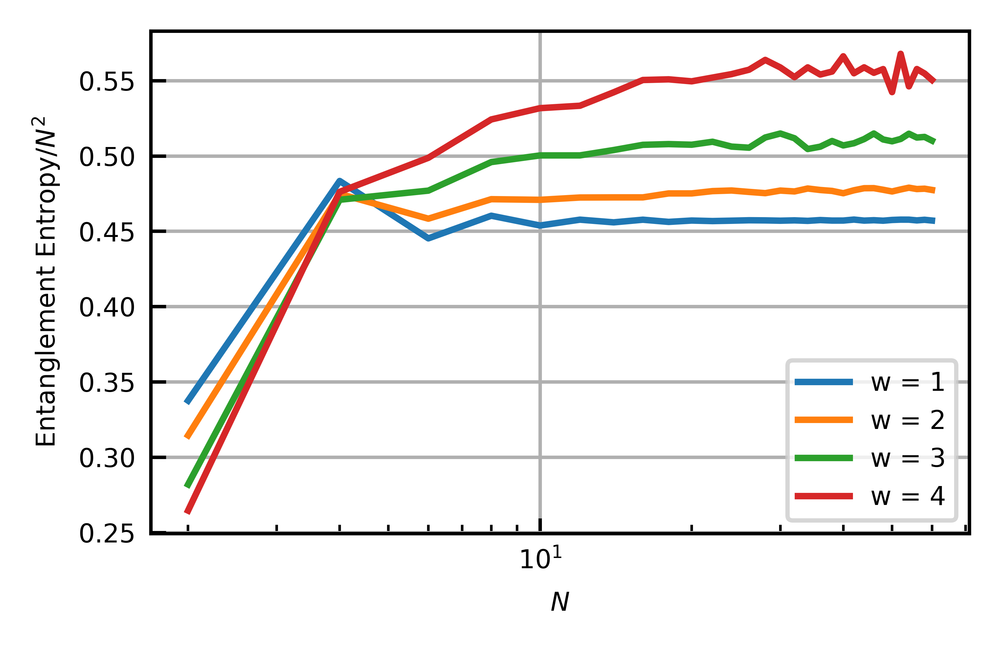

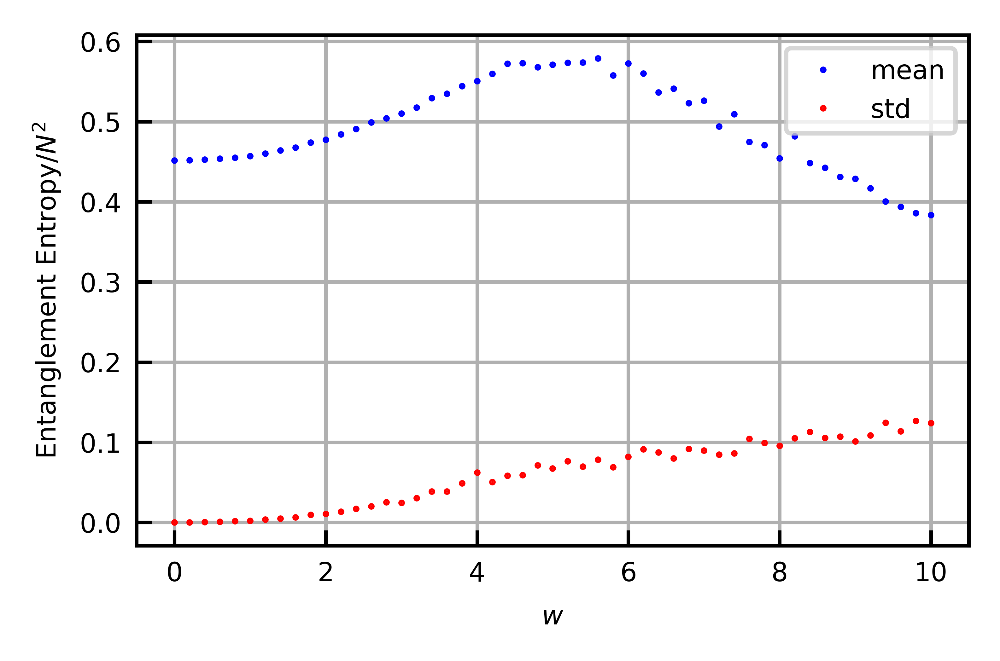

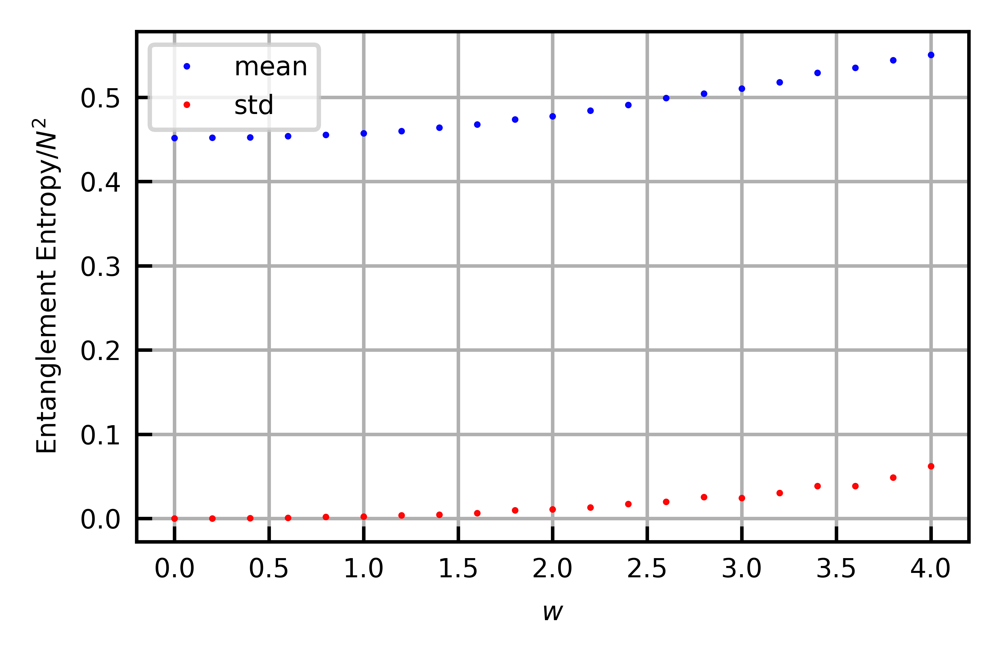

In [77]:
with h5py.File("C:\\Users\\vinic\\Desktop\\Desktop_files\\Master Project\\data\\Entropies_all.h5", "r") as f:
    data = np.array(f["combined_data"])
    print(data.shape)
    for i in range(5, data.shape[0]//2, 5):
        plt.semilogx(np.arange(2, 62, 2), np.mean(data[i], axis=0)/(np.arange(2, 62, 2)**2), "-", label=f"w = {i//5}")
        plt.xlabel("$N$")
        plt.ylabel("Entanglement Entropy/$N^2$")
        plt.legend()
    plt.show()

    mean = (np.mean(data, axis=1)/(np.arange(2, 62, 2)**2))[:, -1]
    std = (np.std(data, axis=1)/(np.arange(2, 62, 2)**2))[:, -1]
    plt.plot(np.arange(0, 10.2, 0.2), mean, ".", color="blue", label="mean", markersize=1, linestyle="", lw=0.5)
    plt.plot(np.arange(0, 10.2, 0.2), std, ".", color="red", label="std", markersize=1, linestyle="", lw=0.5)
    plt.xlabel("$w$")
    plt.ylabel("Entanglement Entropy/$N^2$")
    plt.legend()
    plt.show()

    mean = (np.mean(data, axis=1)/(np.arange(2, 62, 2)**2))[:21, -1]
    std = (np.std(data, axis=1)/(np.arange(2, 62, 2)**2))[:21, -1]
    plt.plot(np.arange(0, 4.2, 0.2), mean, ".", color="blue", label="mean", markersize=1, linestyle="", lw=0.5)
    plt.plot(np.arange(0, 4.2, 0.2), std, ".", color="red", label="std", markersize=1, linestyle="", lw=0.5)
    plt.xlabel("$w$")
    plt.ylabel("Entanglement Entropy/$N^2$")
    plt.legend()
    plt.show()



fast
Hamiltonian built in (fast) 6.340052127838135


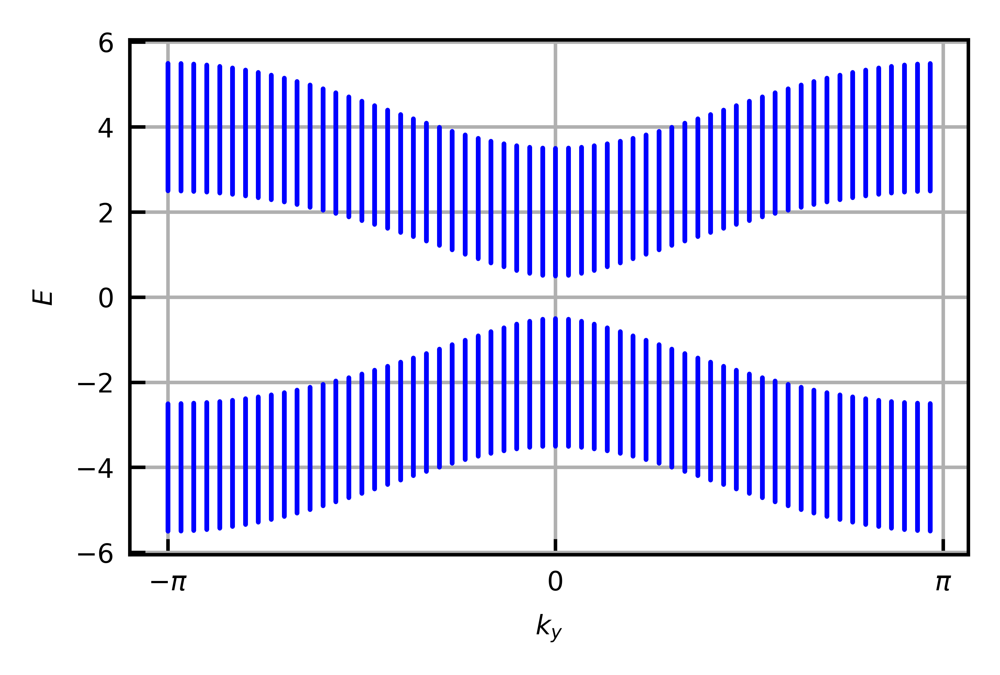

fast
Hamiltonian built in (fast) 5.98058557510376


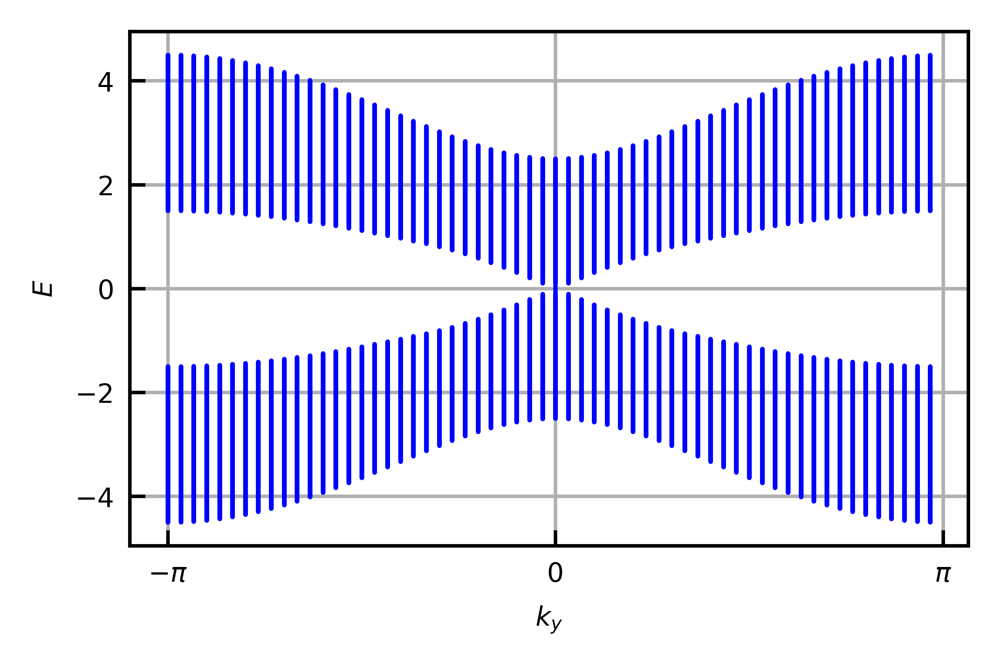

fast
Hamiltonian built in (fast) 6.10350489616394


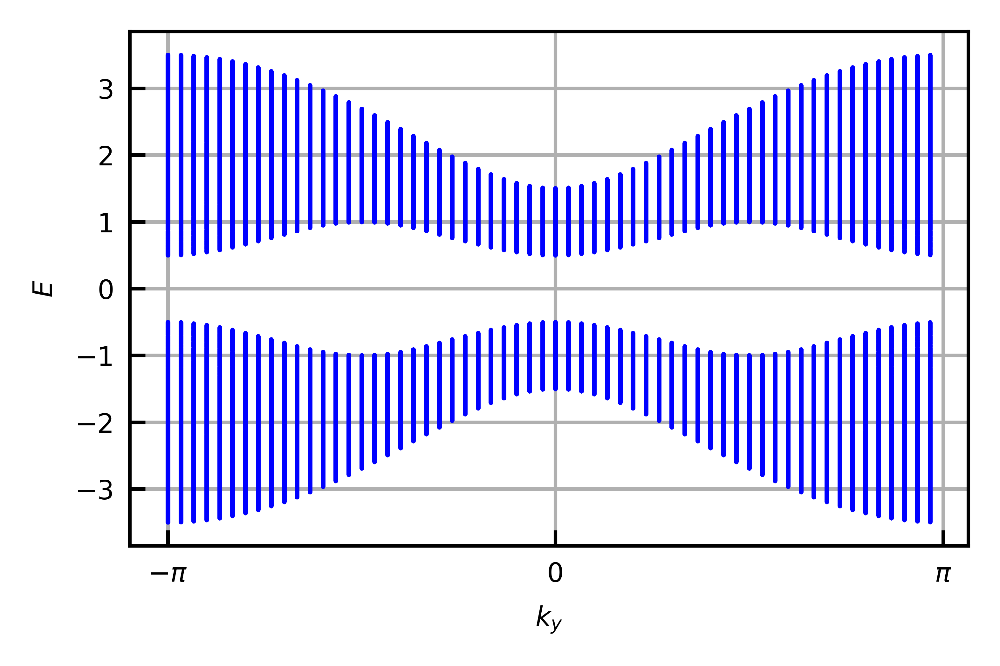

fast
Hamiltonian built in (fast) 8.716344594955444


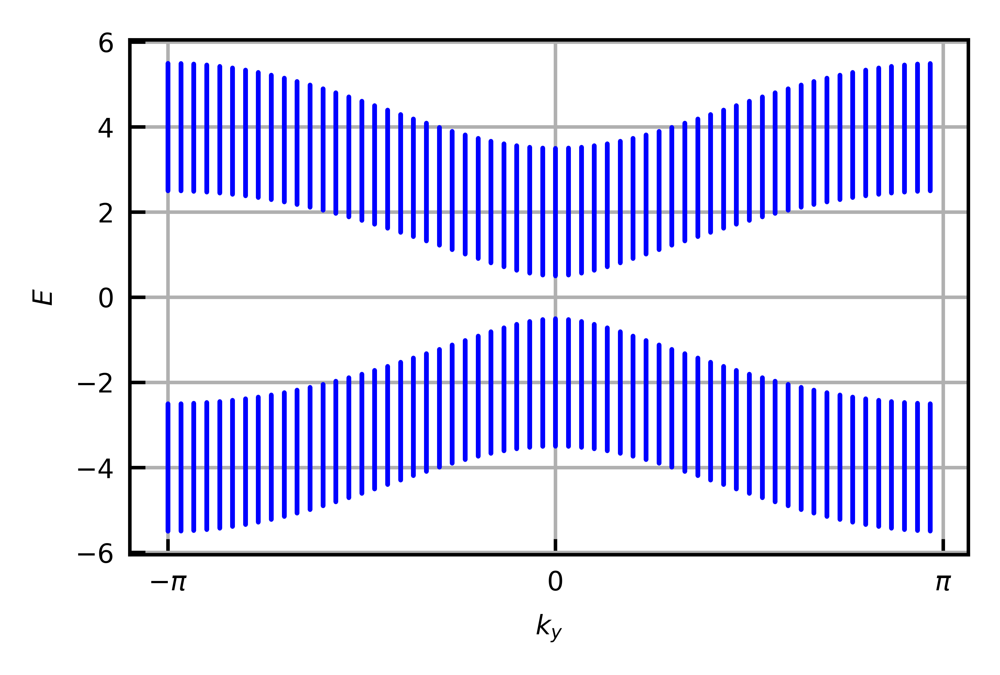

fast
Hamiltonian built in (fast) 11.572965383529663


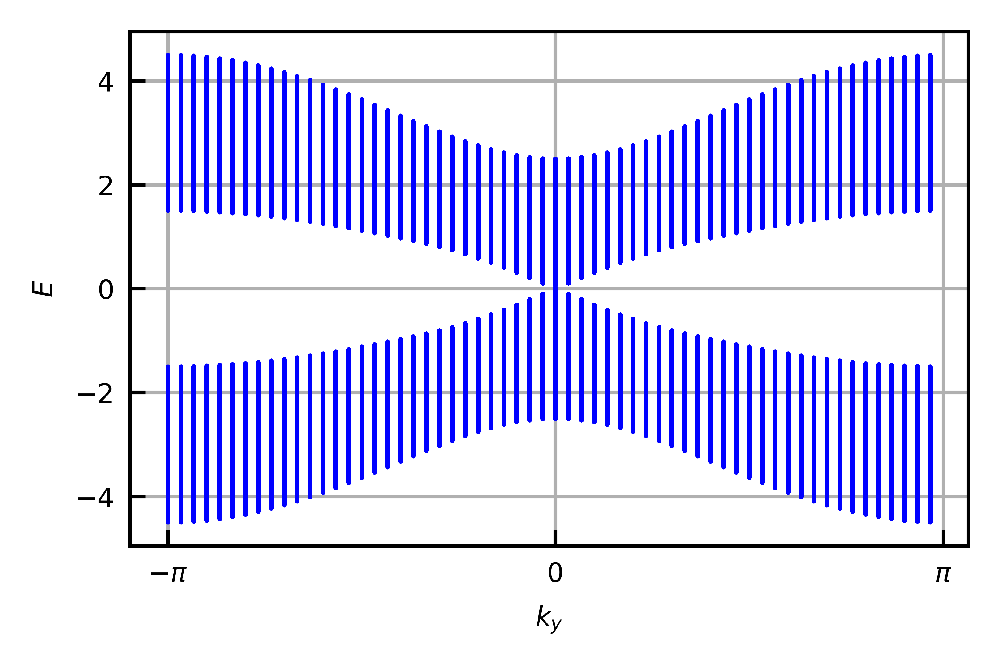

fast
Hamiltonian built in (fast) 9.38398814201355


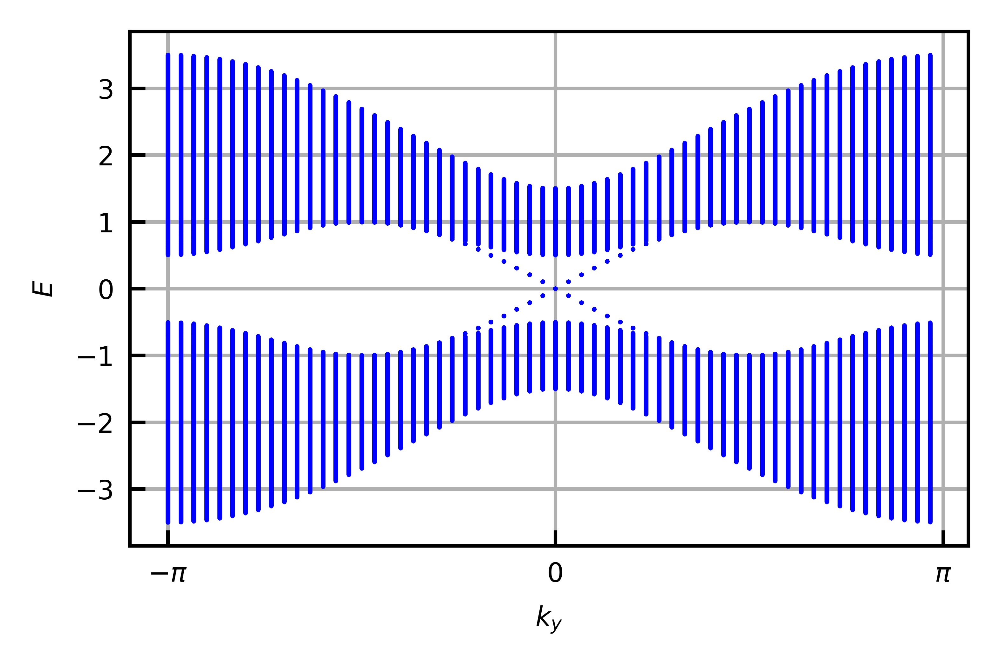

In [62]:
for PBC in ["xyz", "yz"]:
    for m_z in [-1, 0, 1]:
        H = Hamiltonian(L, PBC, t_z, t, t_0, m_z, k_z, w_array[0], disorder=disorder, Fourier=True, fast=True)
        eigvals = np.linalg.eigvalsh(H)

        vals = np.zeros((N, 2*N**2))
        for i in range(N**2):
            index = i // N
            vals[i%N, index*2*N:(index+1)*2*N] = eigvals[i]

        vals = np.concatenate((vals[N//2:], vals[:N//2]), axis=0)

        plt.plot(np.arange(-np.pi, np.pi, 2*np.pi/N), vals, marker=".", markersize=2, markeredgewidth=0, linestyle="", color="blue")
        plt.xlabel("$k_y$")
        plt.ylabel("$E$")
        plt.xticks(ticks=[-np.pi, 0, np.pi], labels=['$-\pi$', '0', '$\pi$'])
        plt.show()


fast
Hamiltonian built in (fast) 6.119623184204102
Diagonalization time: 5.9489405155181885
New V time: 2.424414873123169
Calculating C...


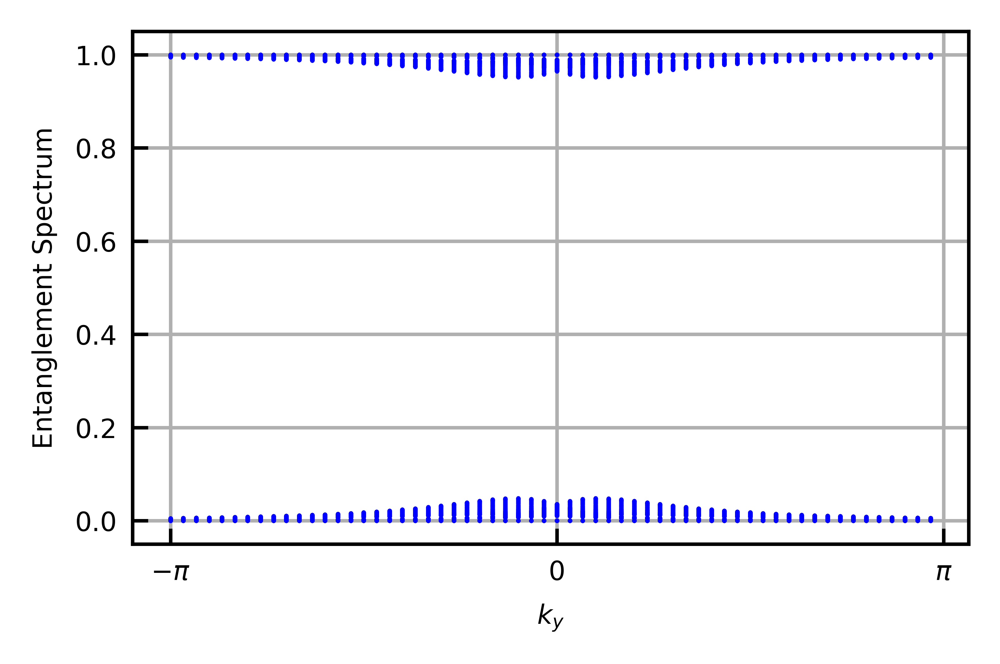

fast
Hamiltonian built in (fast) 5.950027942657471
Diagonalization time: 5.88558554649353
New V time: 2.2399168014526367
Calculating C...


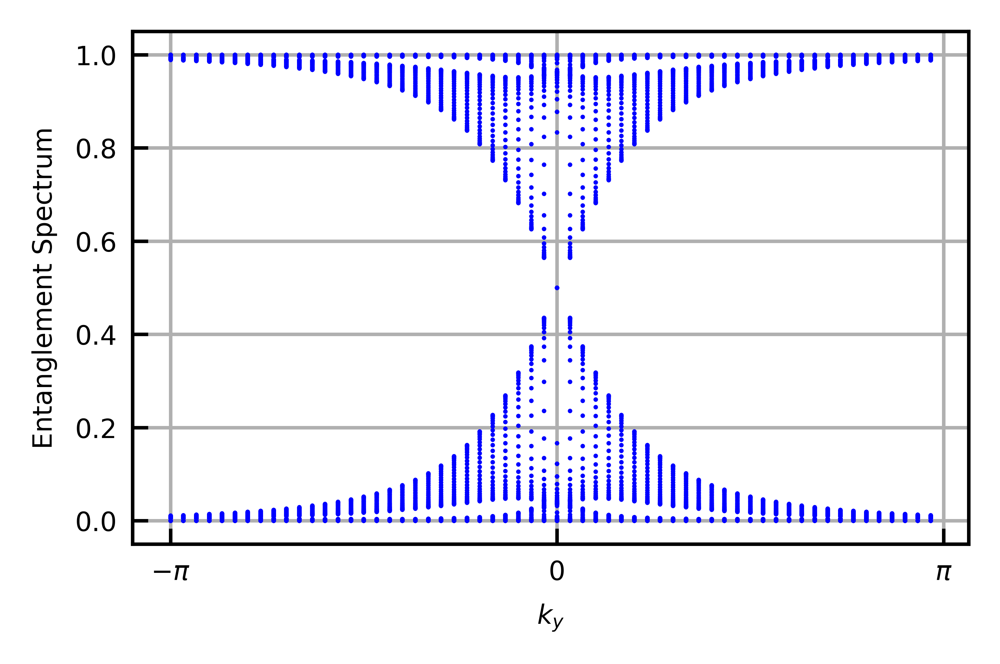

fast
Hamiltonian built in (fast) 5.954564332962036
Diagonalization time: 5.925394535064697
New V time: 2.3976969718933105
Calculating C...


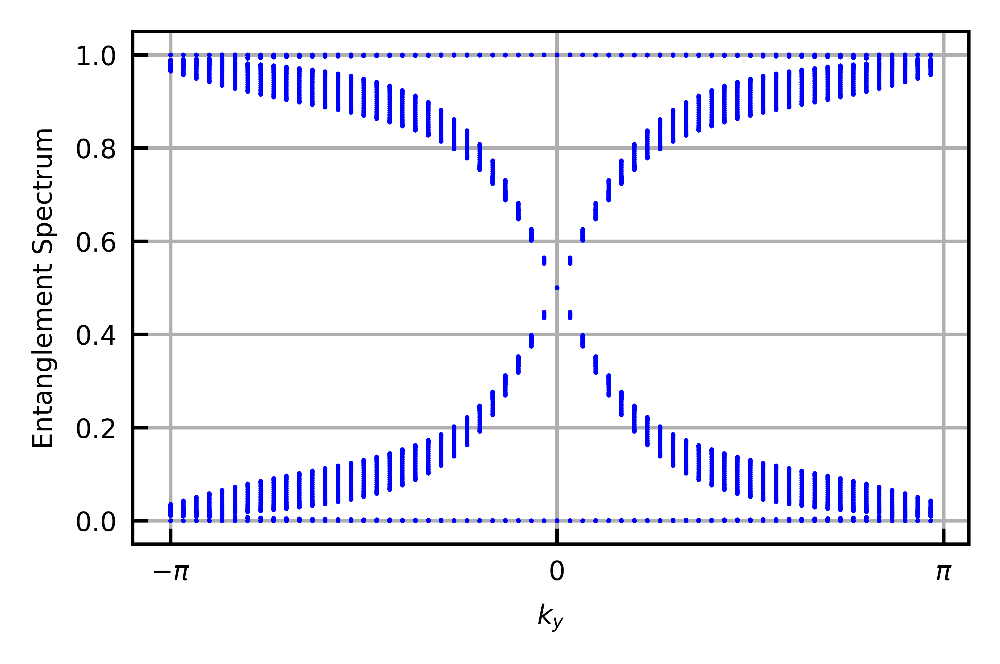

fast
Hamiltonian built in (fast) 5.92950177192688
Diagonalization time: 6.34611177444458
New V time: 2.404548168182373
Calculating C...


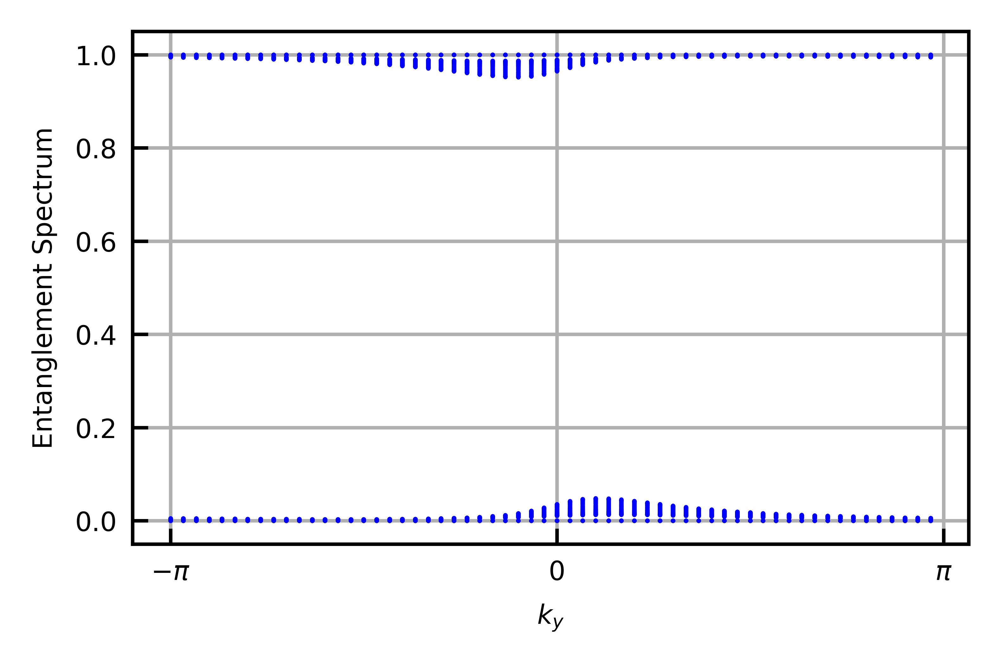

fast
Hamiltonian built in (fast) 5.847174167633057
Diagonalization time: 6.440842628479004
New V time: 2.5087225437164307
Calculating C...


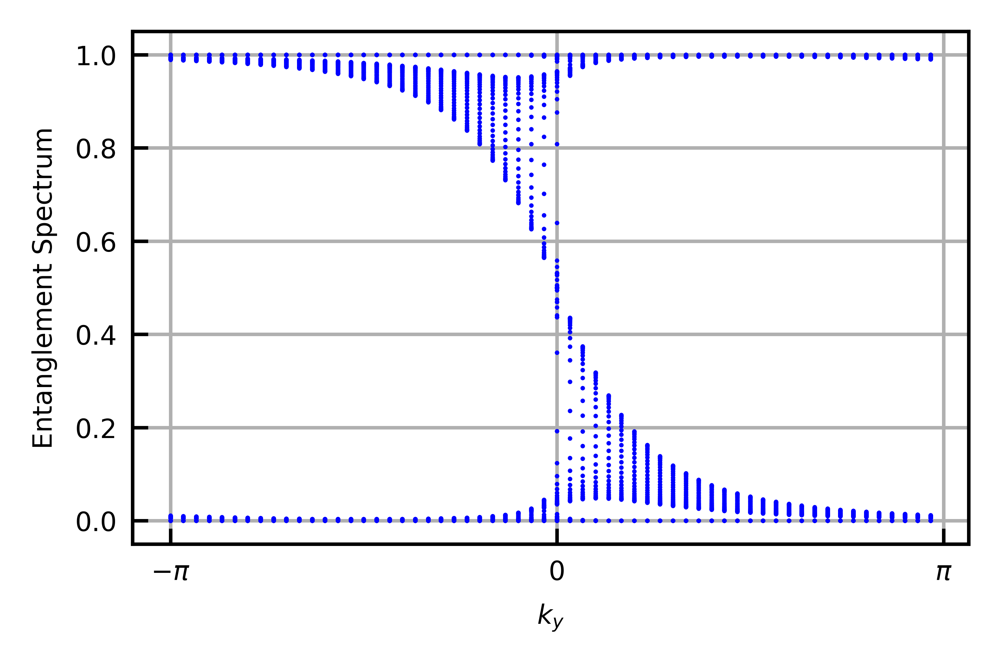

fast
Hamiltonian built in (fast) 6.025119781494141
Diagonalization time: 6.35677695274353
New V time: 2.2873215675354004
Calculating C...


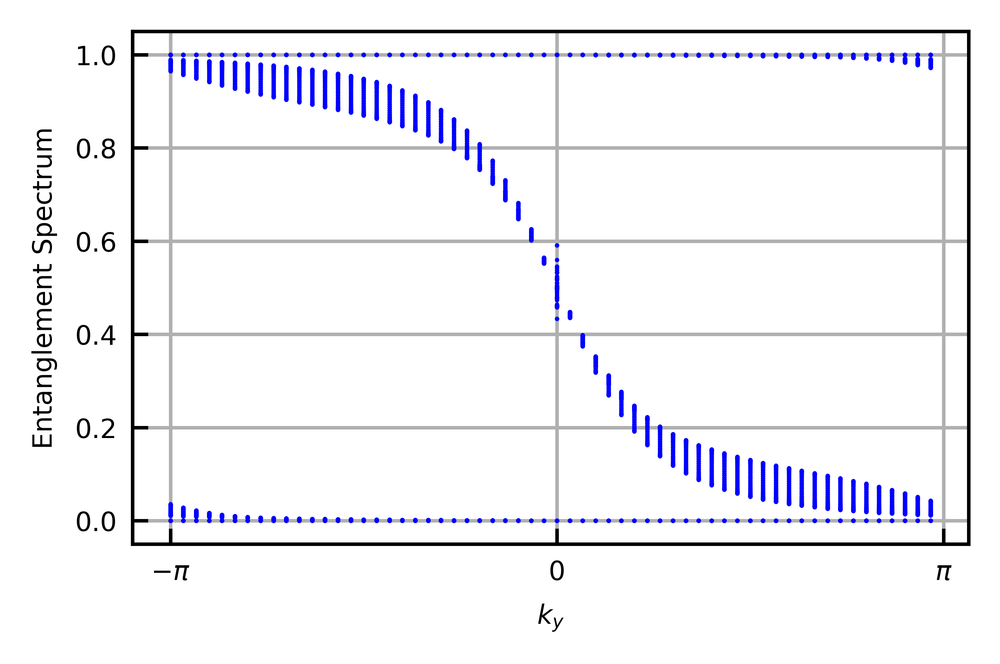

In [64]:
for PBC in ["xyz", "yz"]:
    for m_z in [-1, 0, 1]:
        H = Hamiltonian(L, PBC, t_z, t, t_0, m_z, k_z, w_array[0], disorder=disorder, Fourier=True, fast=True)
        C = generate_C(H, L, axis=axis, FT=FT, fast=True)
        eigvals = np.linalg.eigvalsh(C)

        vals = np.zeros((N, N**2))
        for i in range(N**2):
            index = i // N
            vals[i%N, index*N:(index+1)*N] = eigvals[i]

        vals = np.concatenate((vals[N//2:], vals[:N//2]), axis=0)

        plt.plot(np.arange(-np.pi, np.pi, 2*np.pi/N), vals, marker=".", markersize=2, markeredgewidth=0, linestyle="", color="blue")
        plt.xlabel("$k_y$")
        plt.ylabel("Entanglement Spectrum")
        plt.xticks(ticks=[-np.pi, 0, np.pi], labels=['$-\pi$', '0', '$\pi$'])
        plt.show()


(51, 100, 3600, 60)


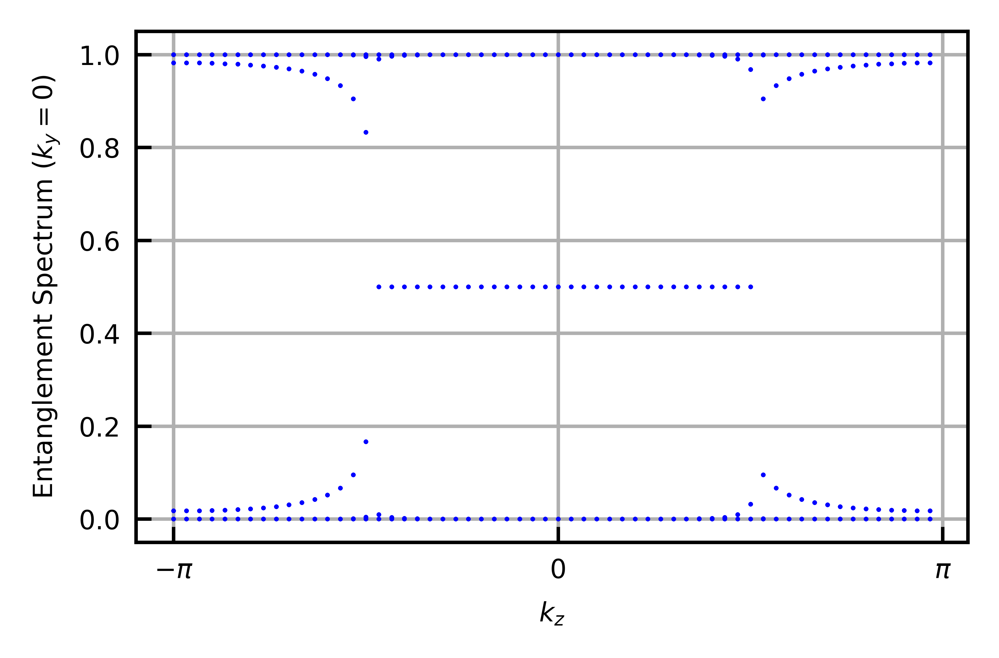

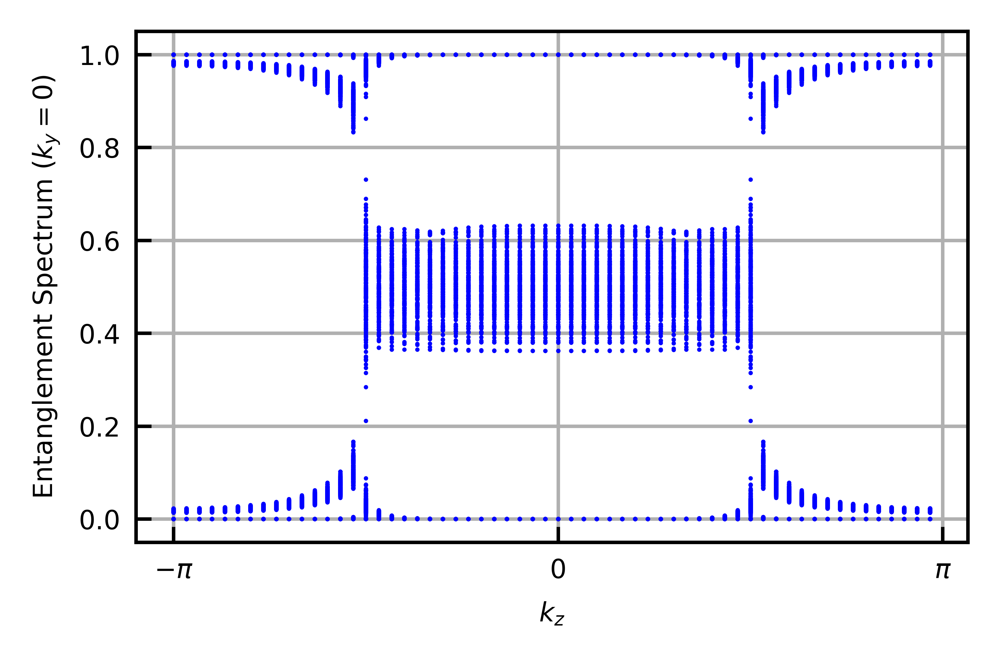

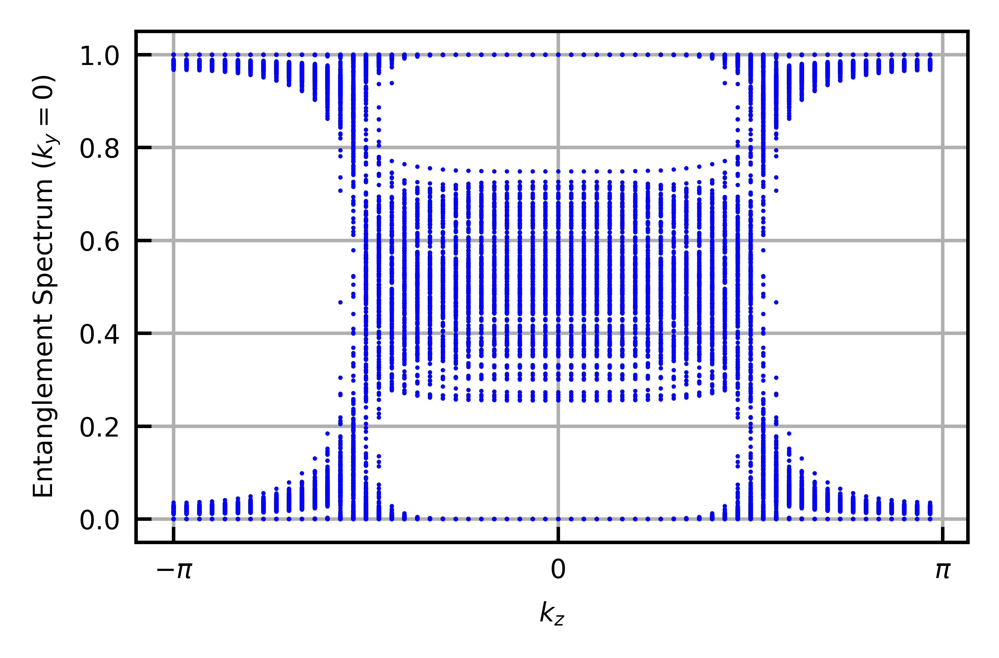

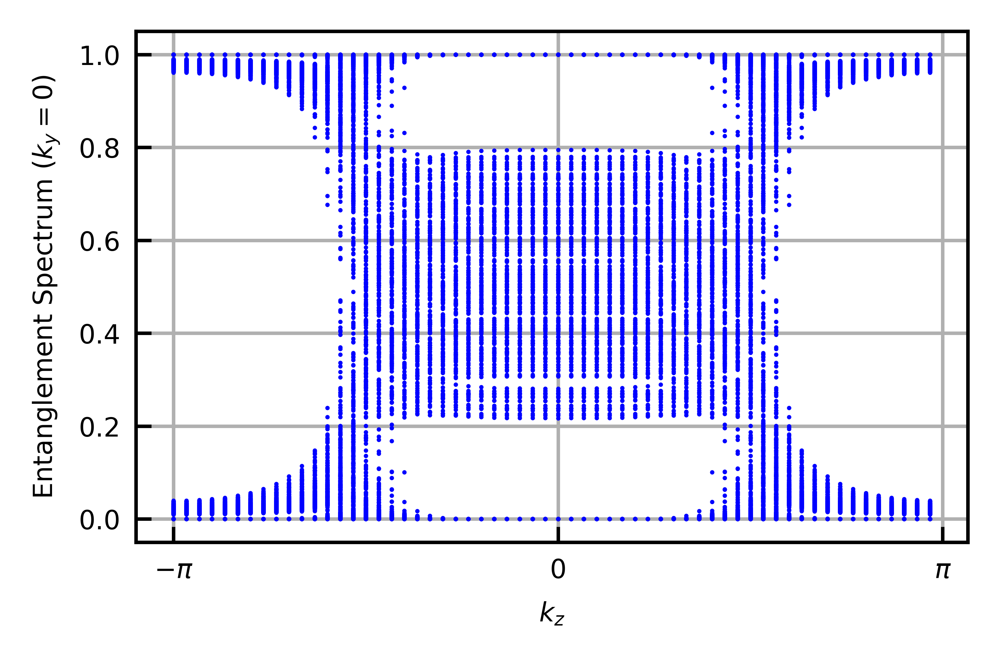

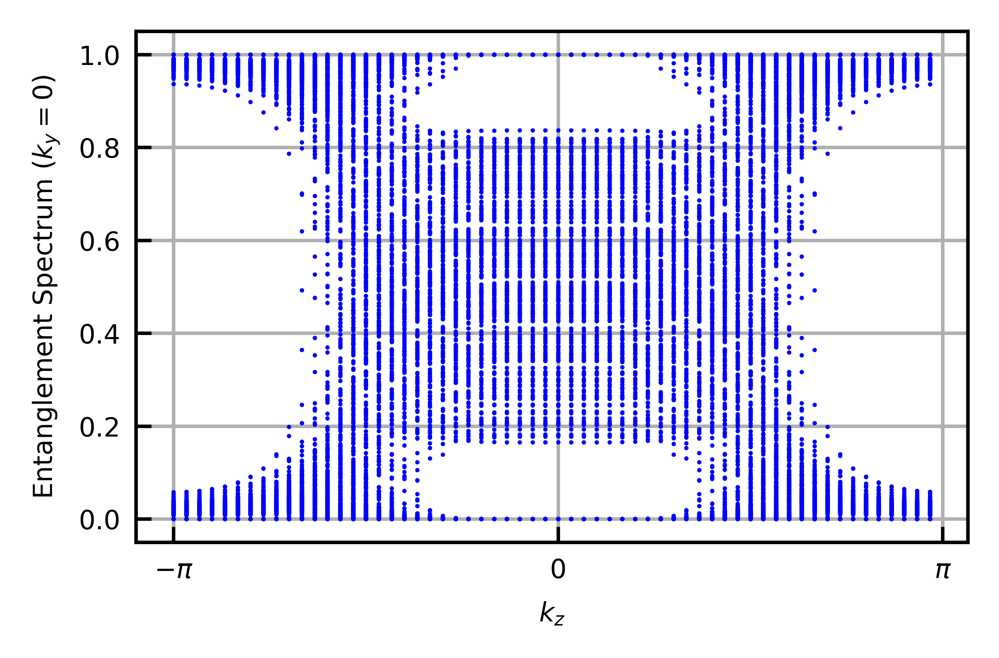

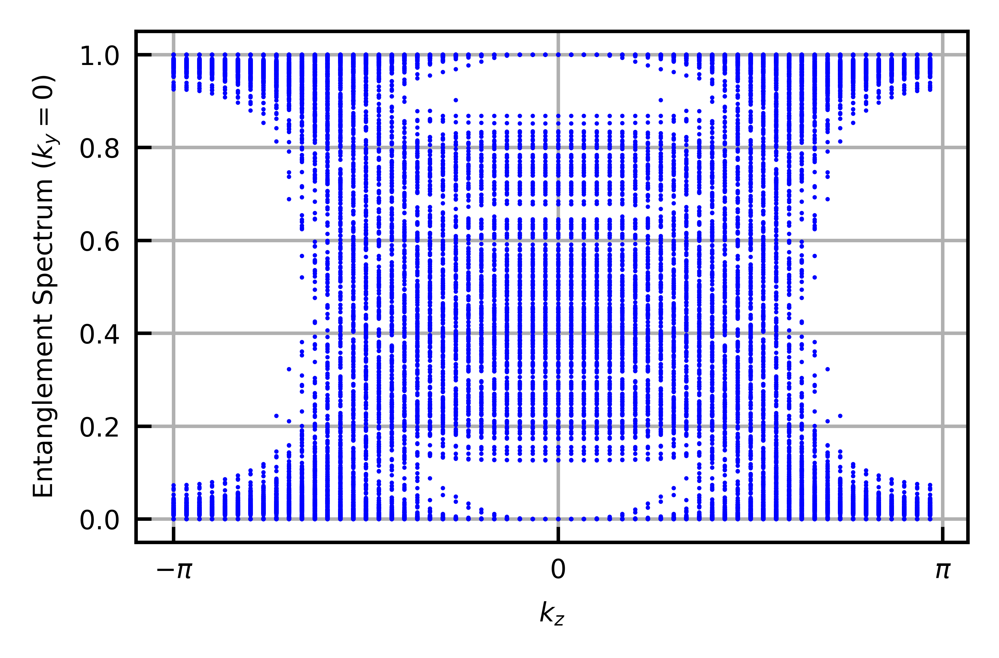

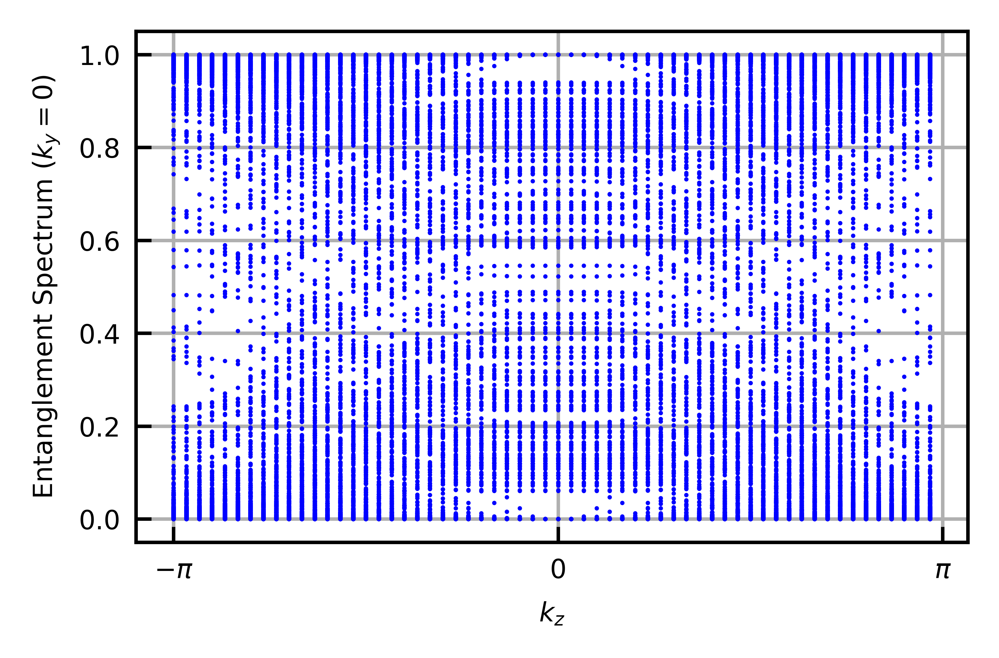

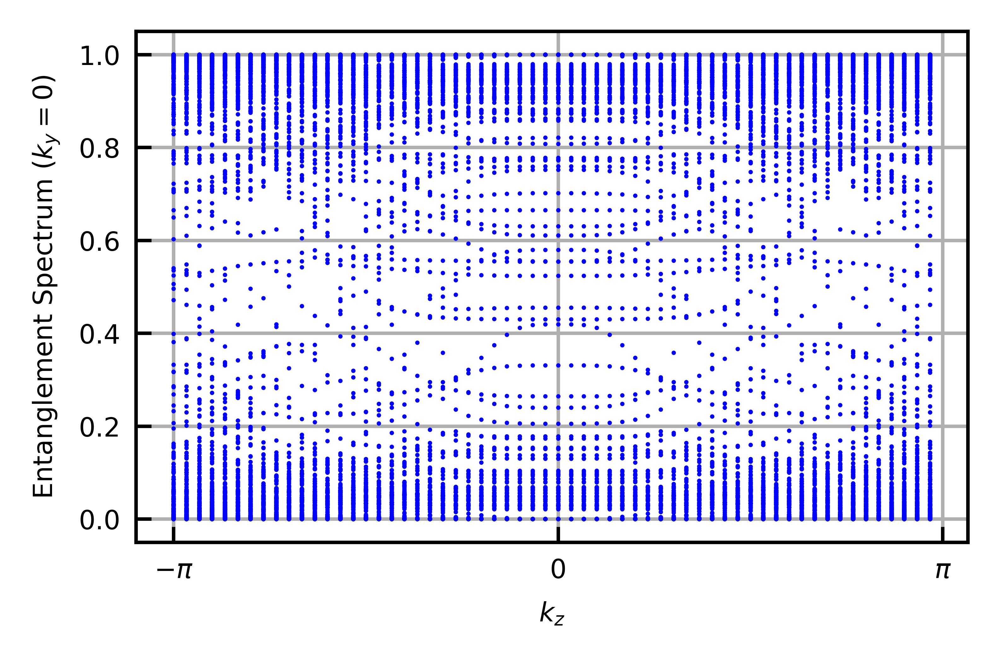

In [86]:
with h5py.File("C:\\Users\\vinic\\Desktop\\Desktop_files\\Master Project\\data\\Entanglement_spectra_all.h5", "r") as f:
    data = np.array(f["combined_data"])
    print(data.shape)
    for i in [0, 3, 6, 8 ,10, 12, 20, 35]:
        values = data[i]
        for d in values:
            vals = d[::N]
            vals = np.concatenate((vals[N//2:], vals[:N//2]), axis=0)
            plt.plot(np.arange(-np.pi, np.pi, 2*np.pi/N), vals, marker=".", markersize=2, markeredgewidth=0, linestyle="", color="blue")
        plt.xlabel("$k_z$")
        plt.ylabel("Entanglement Spectrum ($k_y = 0$)")
        plt.xticks(ticks=[-np.pi, 0, np.pi], labels=['$-\pi$', '0', '$\pi$'])
        plt.show()


(51, 100, 3600, 60)
(100, 3600, 60)


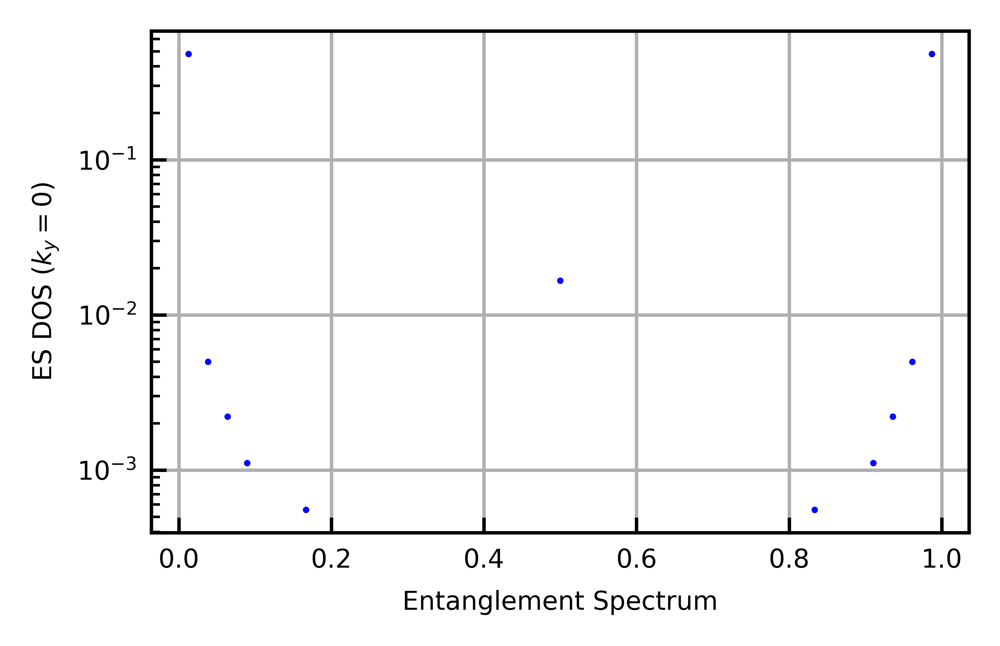

(100, 3600, 60)


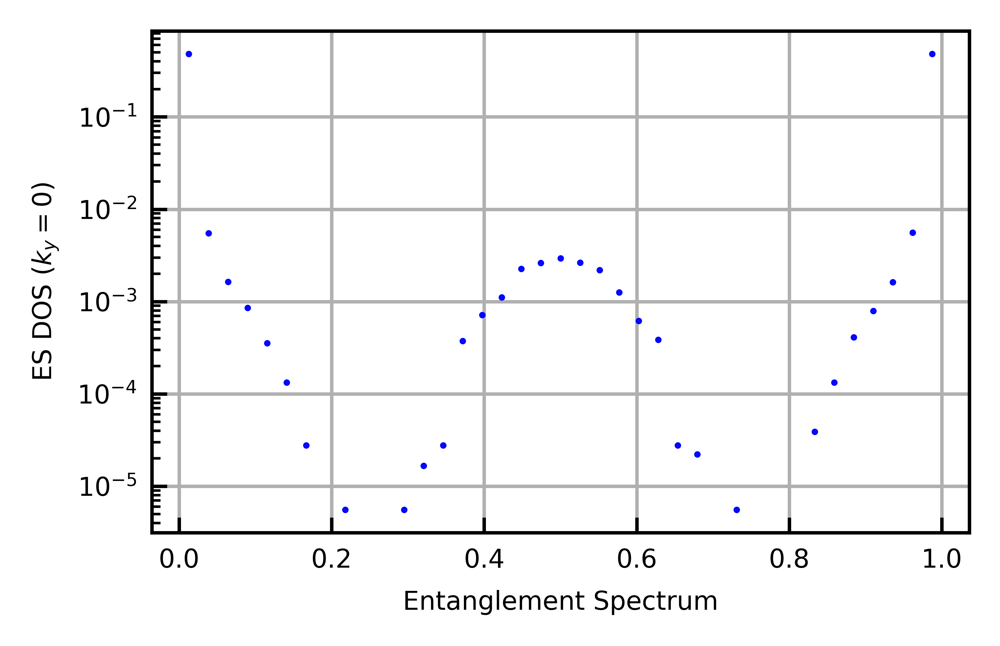

(100, 3600, 60)


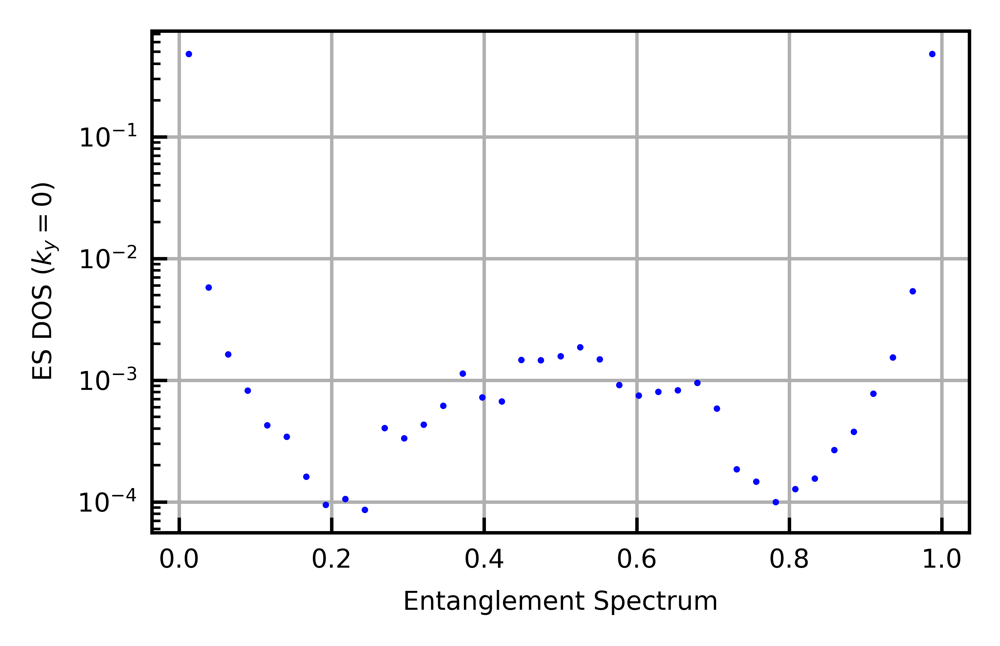

(100, 3600, 60)


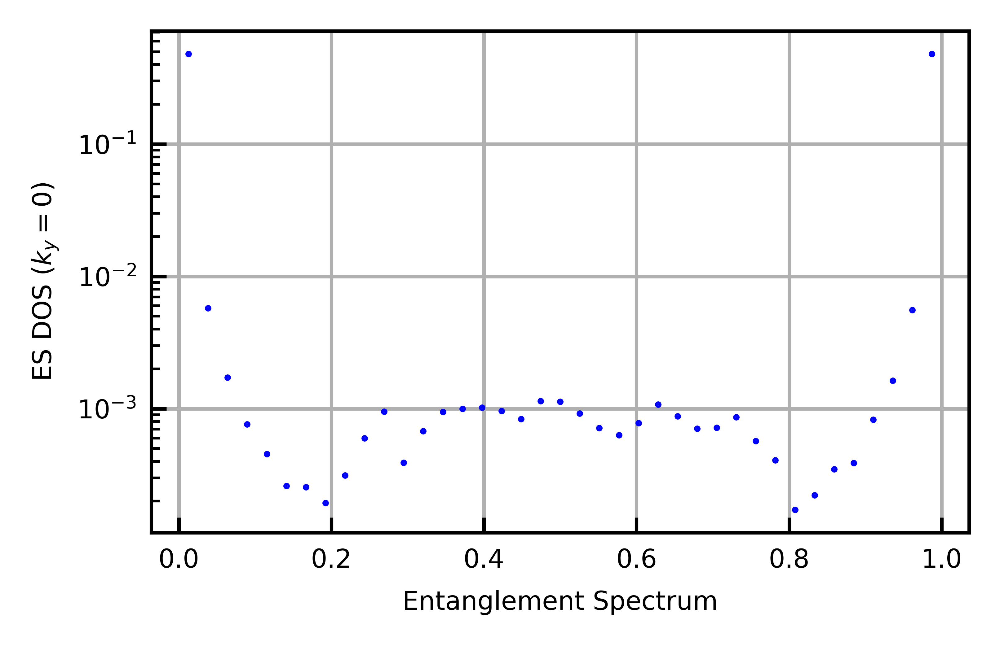

(100, 3600, 60)


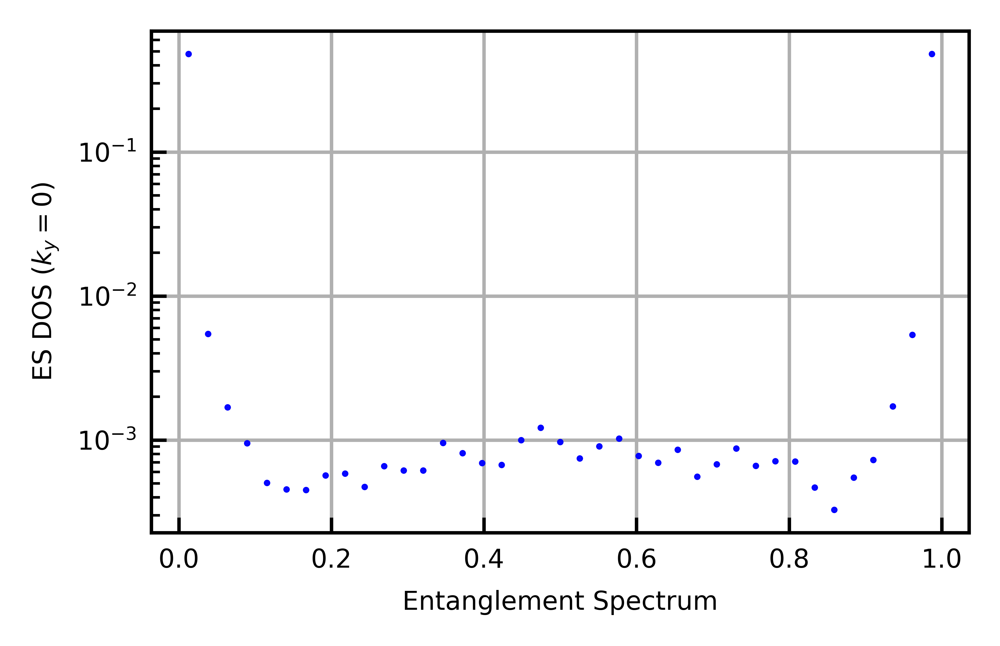

(100, 3600, 60)


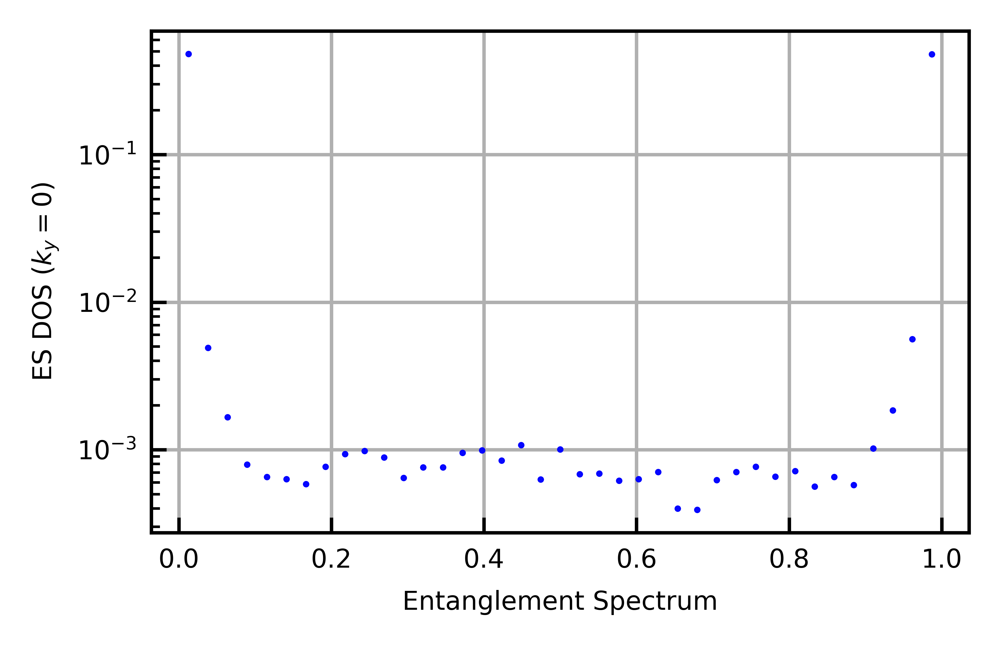

(100, 3600, 60)


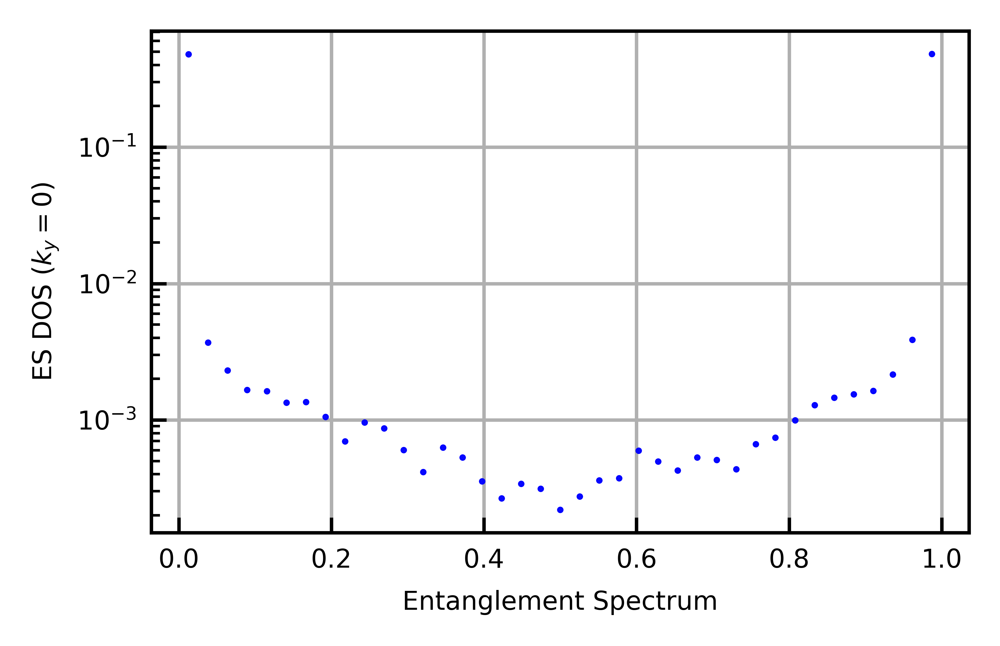

(100, 3600, 60)


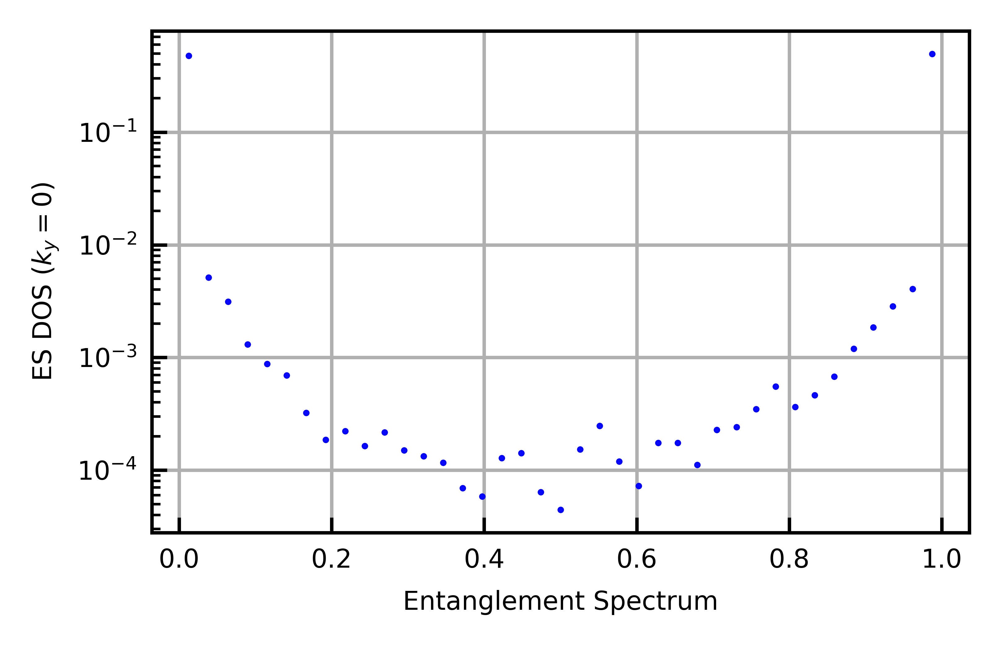

In [88]:
with h5py.File("C:\\Users\\vinic\\Desktop\\Desktop_files\\Master Project\\data\\Entanglement_spectra_all.h5", "r") as f:
    data = np.array(f["combined_data"])
    print(data.shape)
    for i in [0, 3, 6, 8 ,10, 12, 20, 35]:
            values = data[i]
            plt.xlabel("Entanglement Spectrum")
            plt.ylabel("ES DOS ($k_y = 0$)")
            DOS = calc_DOS(values, num_bins, plot=False, ky0 = True, ES=True, log=True, density=False, E0 = False)
            plt.semilogy(DOS[0], DOS[1]/np.sum(DOS[1]), ".", color="blue", markersize=1, linestyle="")
            plt.show()

(51, 100, 3600, 120)
(43200000,)


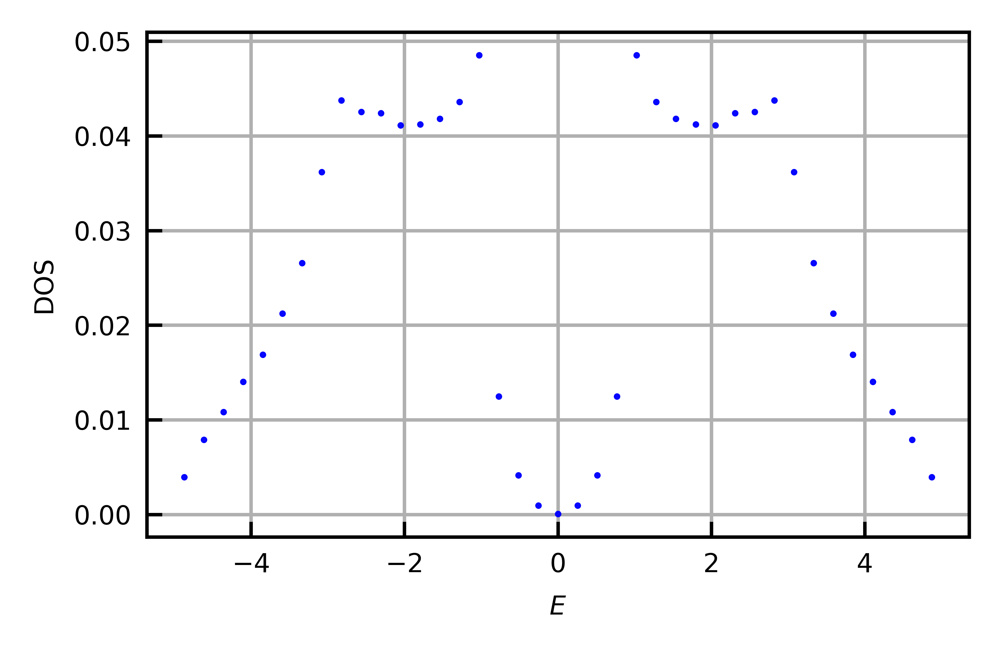

(43200000,)


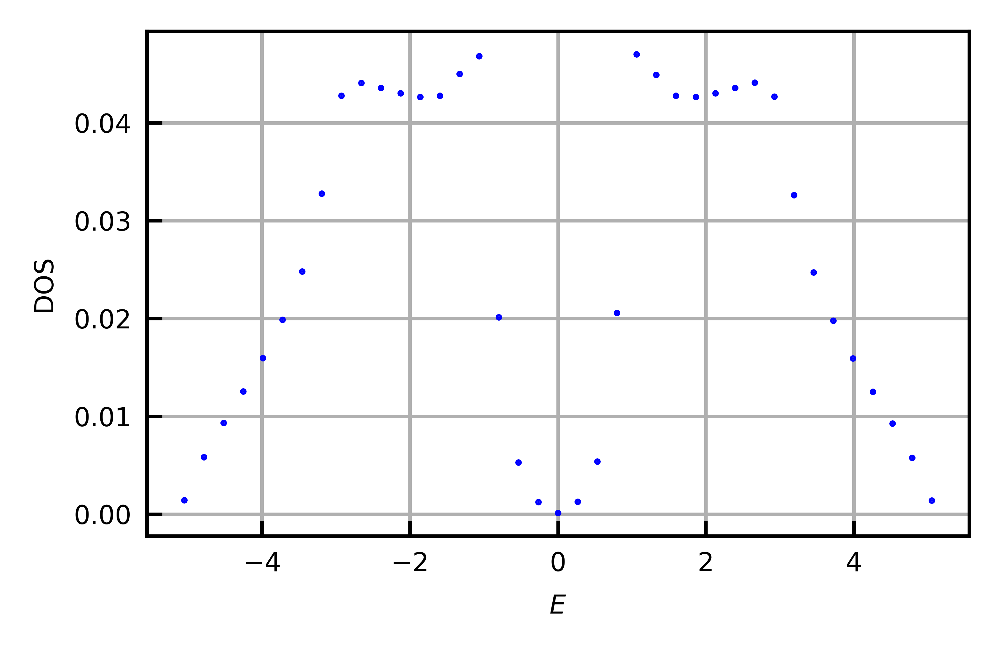

(43200000,)


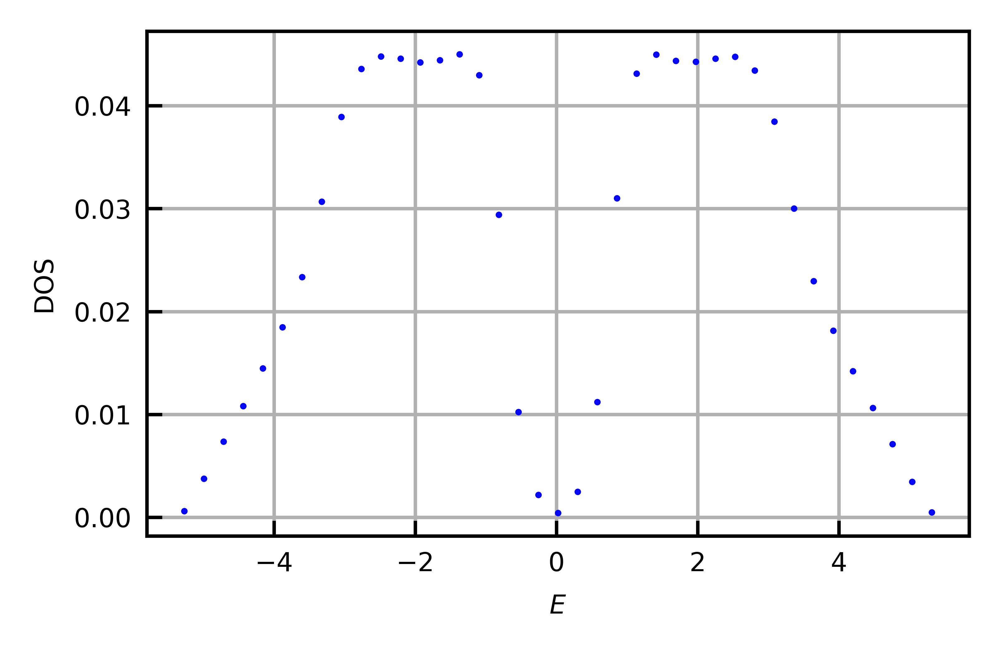

(43200000,)


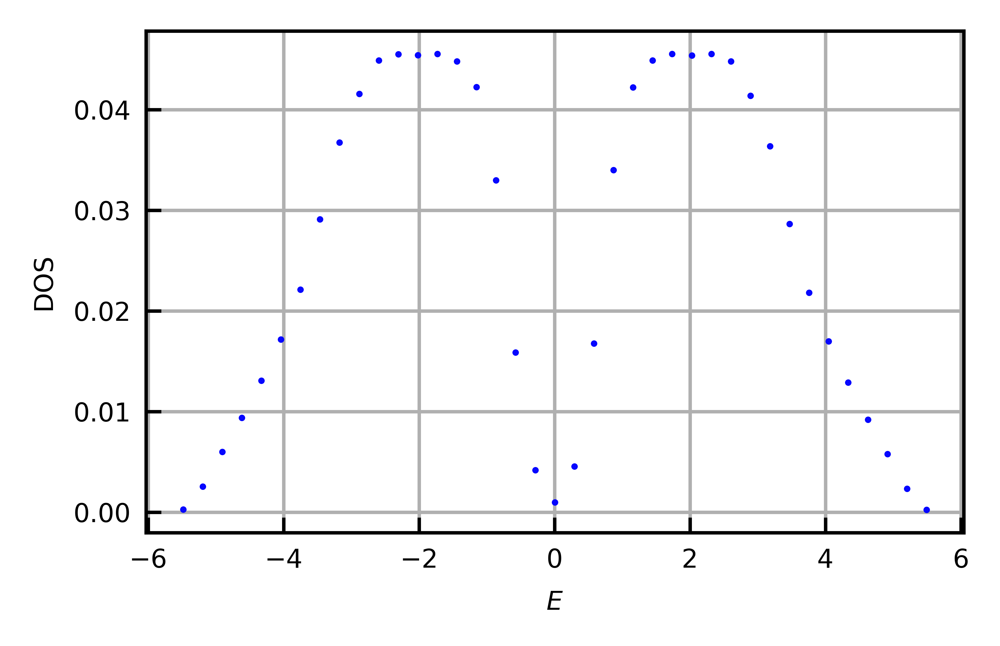

(43200000,)


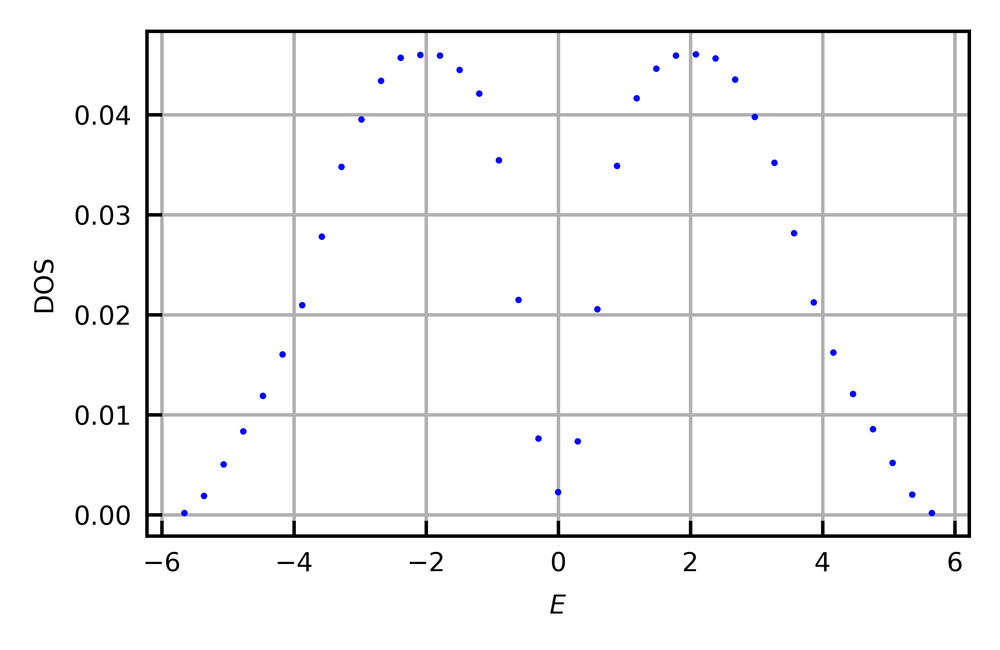

(43200000,)


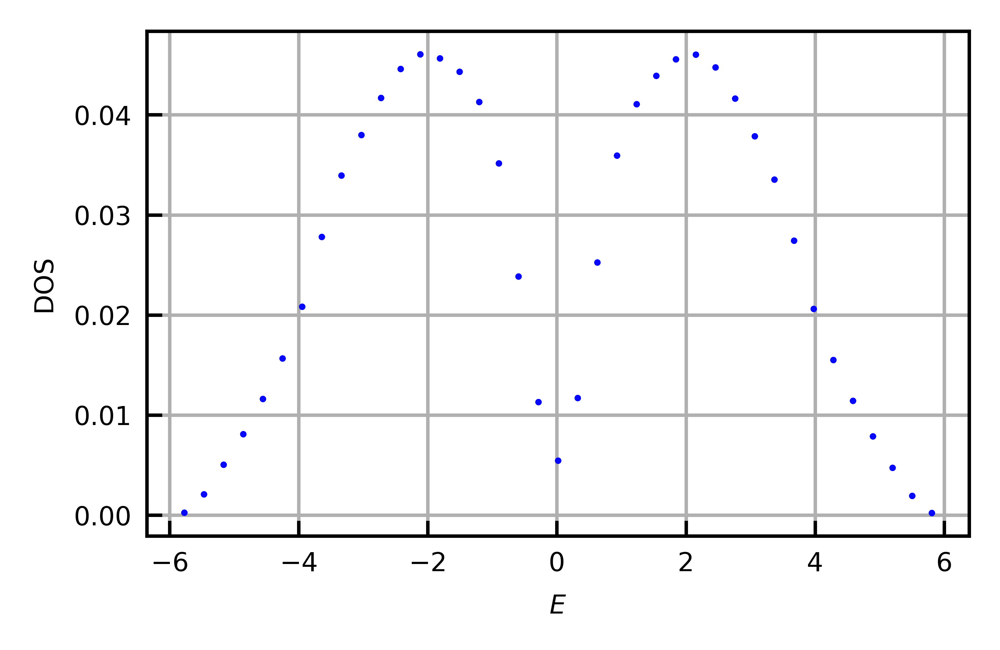

(43200000,)


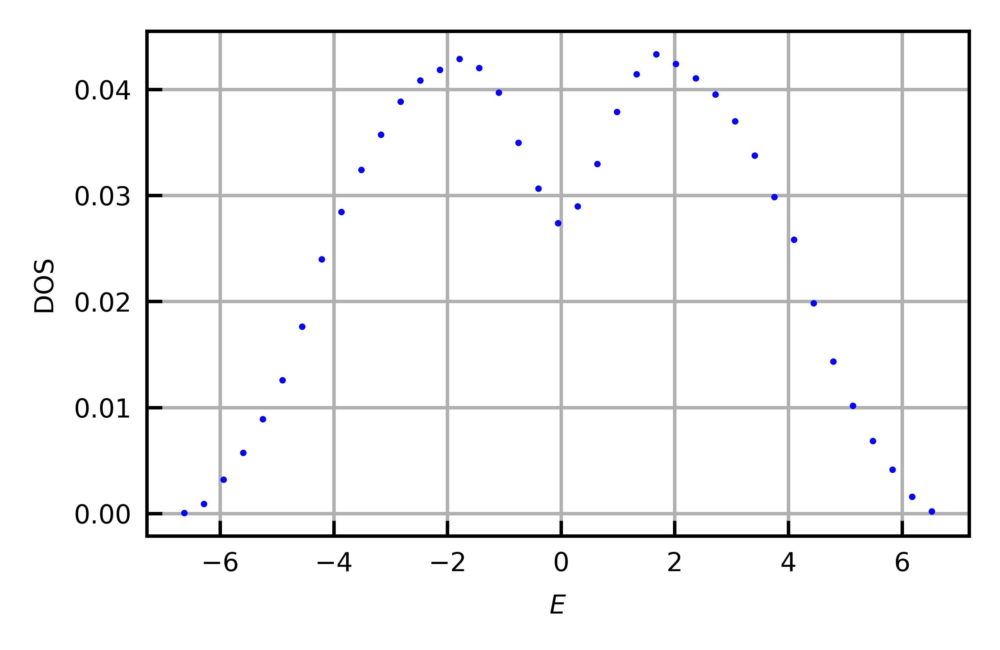

(43200000,)


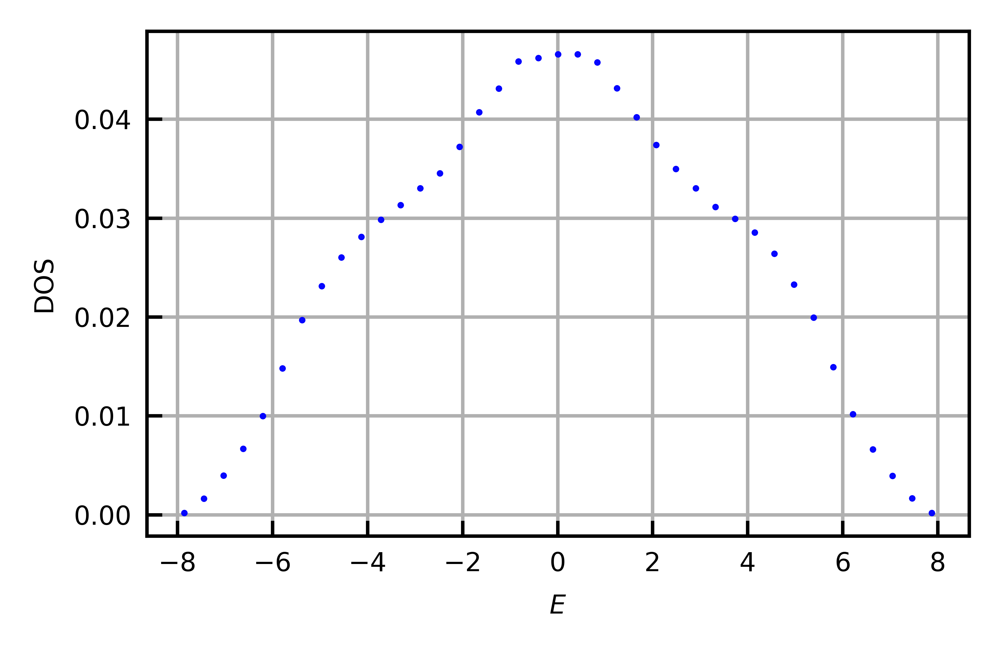

In [92]:
with h5py.File("C:\\Users\\vinic\\Desktop\\Desktop_files\\Master Project\\data\\Physical_spectra_all.h5", "r") as f:
    data = np.array(f["combined_data"])
    print(data.shape)
    for i in [0, 3, 6, 8 ,10, 12, 20, 35]:
        plt.xlabel("$E$")
        plt.ylabel("DOS")
        DOS = calc_DOS(data[i].flatten(), num_bins, plot=False, ky0 = False, ES=False, log=False, density=False, E0 = False)
        plt.plot(DOS[0], DOS[1]/np.sum(DOS[1]), ".", color="blue", markersize=1, linestyle="")
        plt.show()

fast
Hamiltonian built in (fast) 6.756600856781006
Diagonalization time: 5.909661054611206
New V time: 2.5448219776153564
Calculating C...


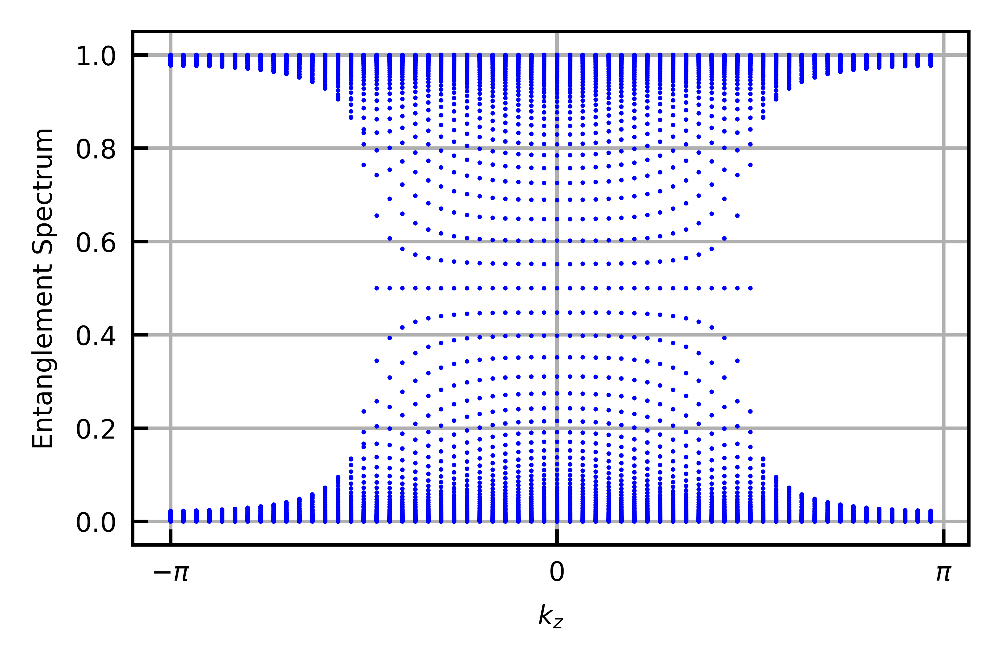

fast
Hamiltonian built in (fast) 6.262566804885864
Diagonalization time: 5.9844958782196045
New V time: 2.6446781158447266
Calculating C...


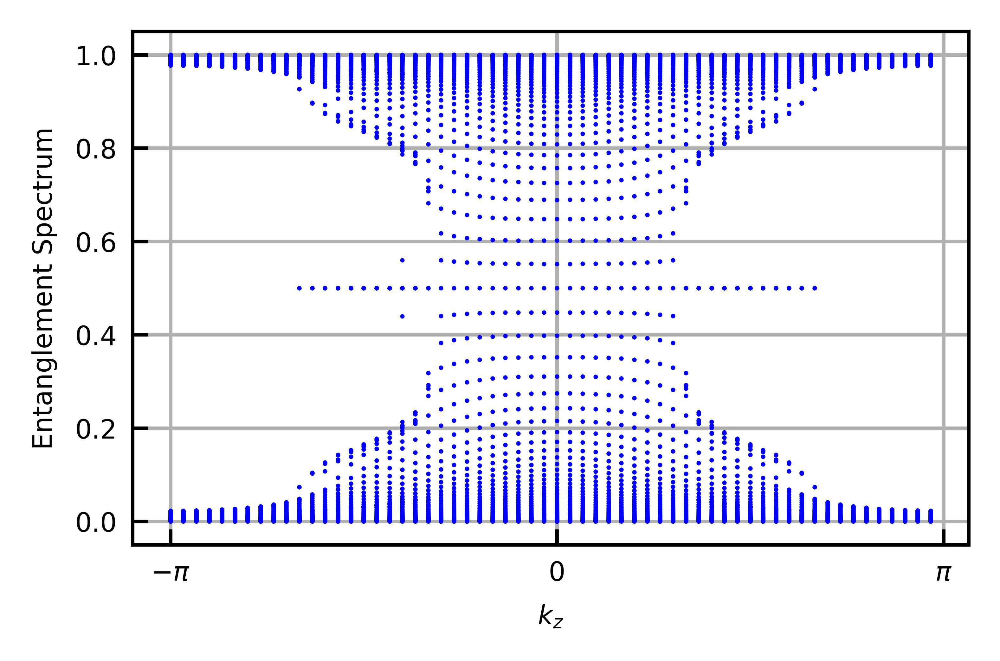

fast
Hamiltonian built in (fast) 6.182341575622559
Diagonalization time: 1188.9138567447662
New V time: 4.263067722320557
Calculating C...


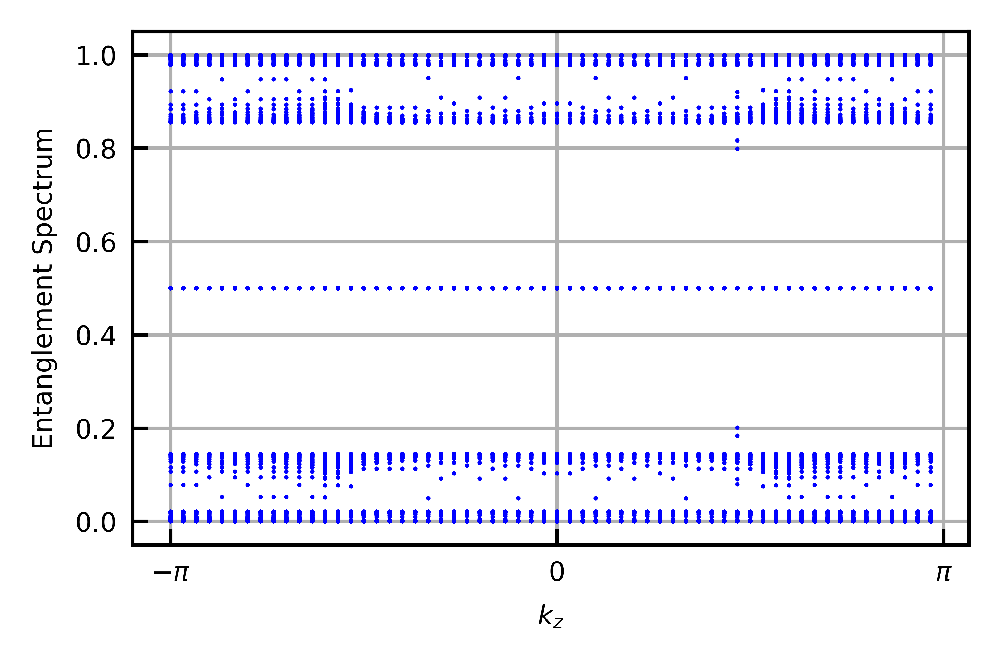

fast
Hamiltonian built in (fast) 6.709099292755127
Diagonalization time: 6.026191234588623
New V time: 4.287102460861206
Calculating C...


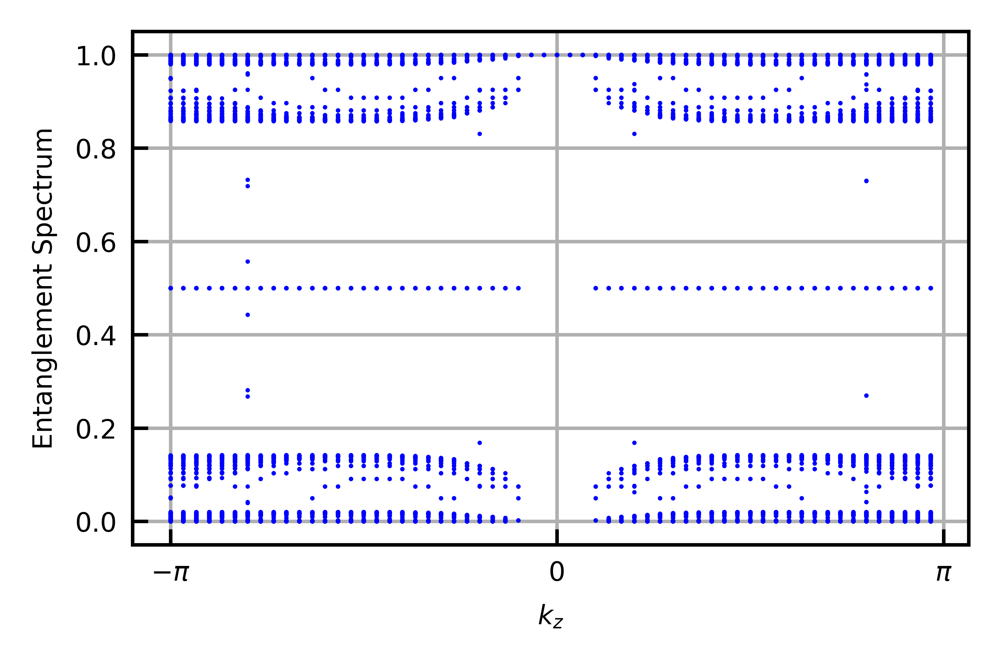

fast
Hamiltonian built in (fast) 6.608388900756836
Diagonalization time: 5.953843116760254
New V time: 5.354800701141357
Calculating C...


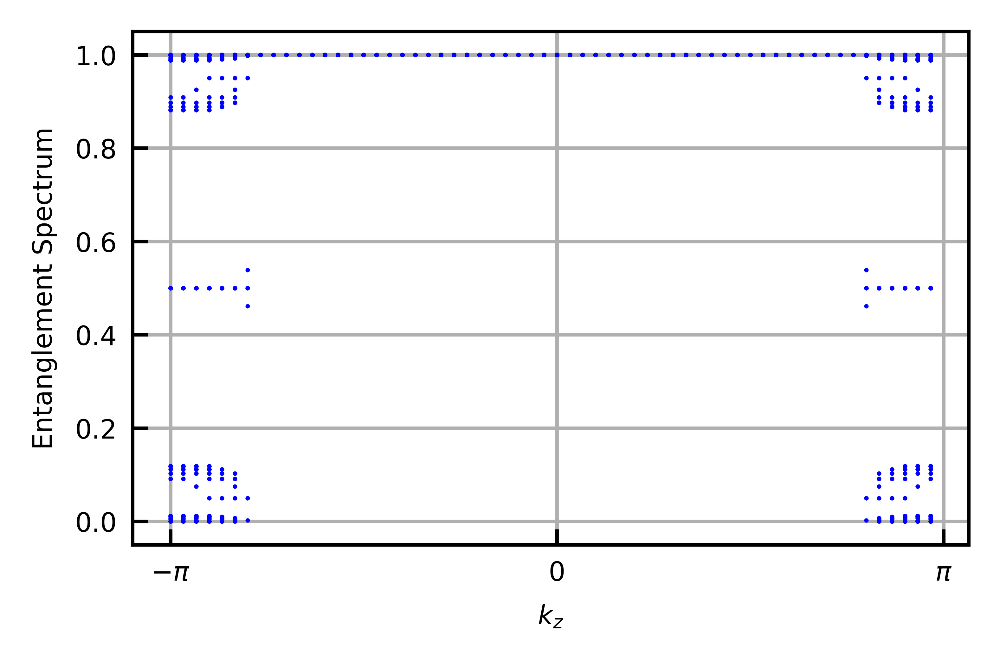

fast
Hamiltonian built in (fast) 6.399153709411621
Diagonalization time: 5.946809768676758
New V time: 5.399055480957031
Calculating C...


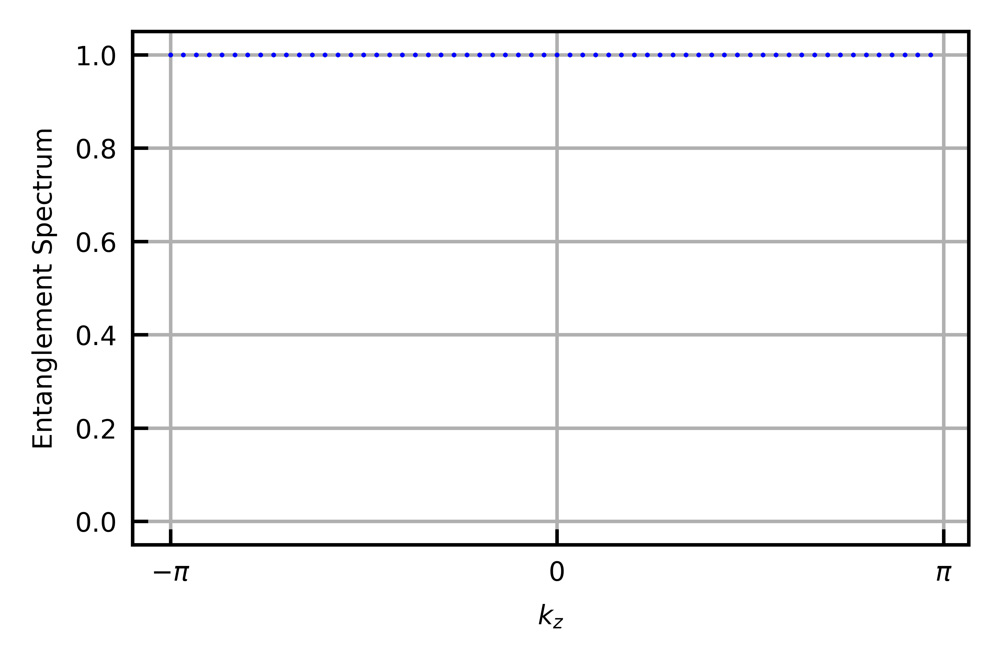

In [99]:
for i in [512, 515, 768, 896, 1021, 1024]:
    H = Hamiltonian(L, PBC, t_z, t, t_0, m_z, k_z, w=0, disorder=disorder, Fourier=True, fast=True)
    C = generate_C(H, L, axis=axis, FT=FT, fast=True, fill=i)
    eigvals = np.linalg.eigvalsh(C)
    vals = np.zeros((N, N**2))
    for j in range(N**2):
        index = j % N
        vals[j//N, index*N:(index+1)*N] = eigvals[j]
    vals = np.concatenate((vals[N//2:], vals[:N//2]), axis=0)
    plt.xlabel("$k_z$")
    plt.ylabel("Entanglement Spectrum")
    plt.xticks(ticks=[-np.pi, 0, np.pi], labels=['$-\pi$', '0', '$\pi$'])
    plt.ylim(-0.05, 1.05)
    plt.plot(np.arange(-np.pi, np.pi, 2*np.pi/N), vals, marker=".", markersize=2, markeredgewidth=0, linestyle="", color="blue")
    plt.show()

fast
Hamiltonian built in (fast) 0.0014715194702148438
Diagonalization time: 0.0
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.004025697708129883
Diagonalization time: 0.0020139217376708984
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.005143404006958008
Diagonalization time: 0.0014867782592773438
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.011612176895141602
Diagonalization time: 0.001813650131225586
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.02367424964904785
Diagonalization time: 0.008258581161499023
New V time: 0.003288745880126953
Calculating C...
fast
Hamiltonian built in (fast) 0.05005025863647461
Diagonalization time: 0.024317026138305664
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.0875394344329834
Diagonalization time: 0.02590656280517578
New V time: 0.005488872528076172
Calculating C...
fast
Hamiltonian built in (fast) 0.11266136169433594
Diagonalization time: 

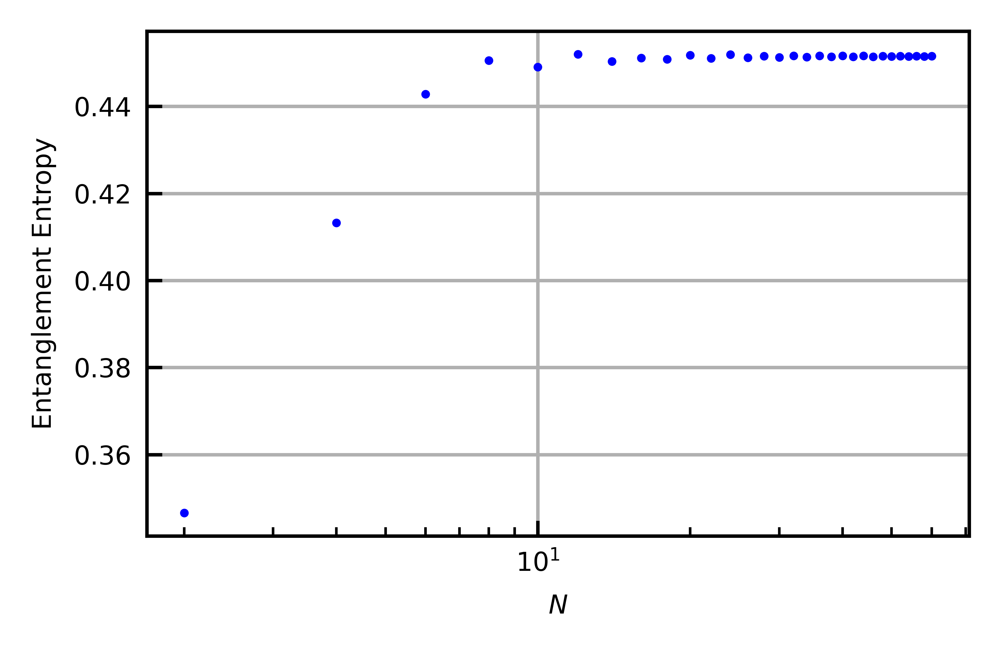

fast
Hamiltonian built in (fast) 0.0
Diagonalization time: 0.0
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.0010988712310791016
Diagonalization time: 0.0
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.012016534805297852
Diagonalization time: 0.0
New V time: 0.0
Calculating C...
fast
Hamiltonian built in (fast) 0.023476123809814453
Diagonalization time: 0.0
New V time: 0.014040231704711914
Calculating C...
fast
Hamiltonian built in (fast) 0.04369759559631348
Diagonalization time: 0.01431417465209961
New V time: 0.0016014575958251953
Calculating C...
fast
Hamiltonian built in (fast) 0.07789874076843262
Diagonalization time: 0.027245044708251953
New V time: 0.008729219436645508
Calculating C...
fast
Hamiltonian built in (fast) 0.10677075386047363
Diagonalization time: 0.03828907012939453
New V time: 0.006013154983520508
Calculating C...
fast
Hamiltonian built in (fast) 0.18490839004516602
Diagonalization time: 0.06773114204406738
New V time: 0.0

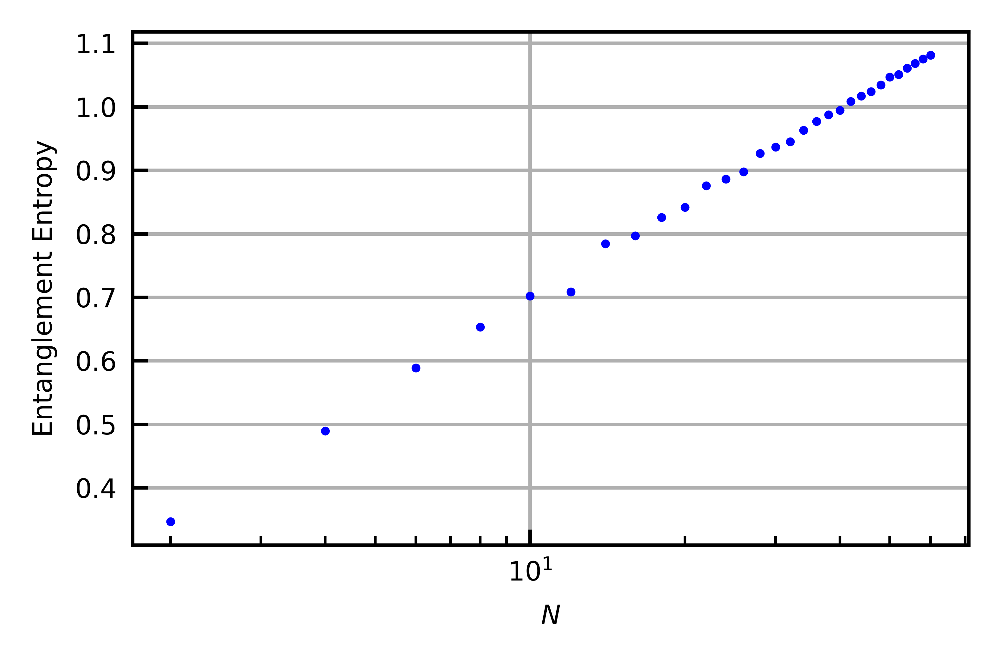

In [102]:
for i in [512, 768]:
    entropies = np.zeros(N//2)
    for j in range(2, N + 2, 2):
        L = [j, j, j]
        H = Hamiltonian(L, PBC, t_z, t, t_0, m_z, k_z, w=0, disorder=disorder, Fourier=True, fast=True)
        C = generate_C(H, L, axis=axis, FT=FT, fast=True, fill=i)
        eigvals = np.linalg.eigvalsh(C)
        eigvals = eigvals[(eigvals > 0) & (eigvals < 1)]
        entropies[j//2 - 1] = np.sum(-eigvals*np.log(eigvals) - (1 - eigvals)*np.log(1 - eigvals))
    plt.xlabel("$N$")
    plt.ylabel("Entanglement Entropy")
    plt.semilogx(np.arange(2, N + 2, 2), entropies/(np.arange(2, 62, 2)**2), marker=".", markersize=2, linestyle="", color="blue")
    plt.show()
        

(51, 100, 3600, 120)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)


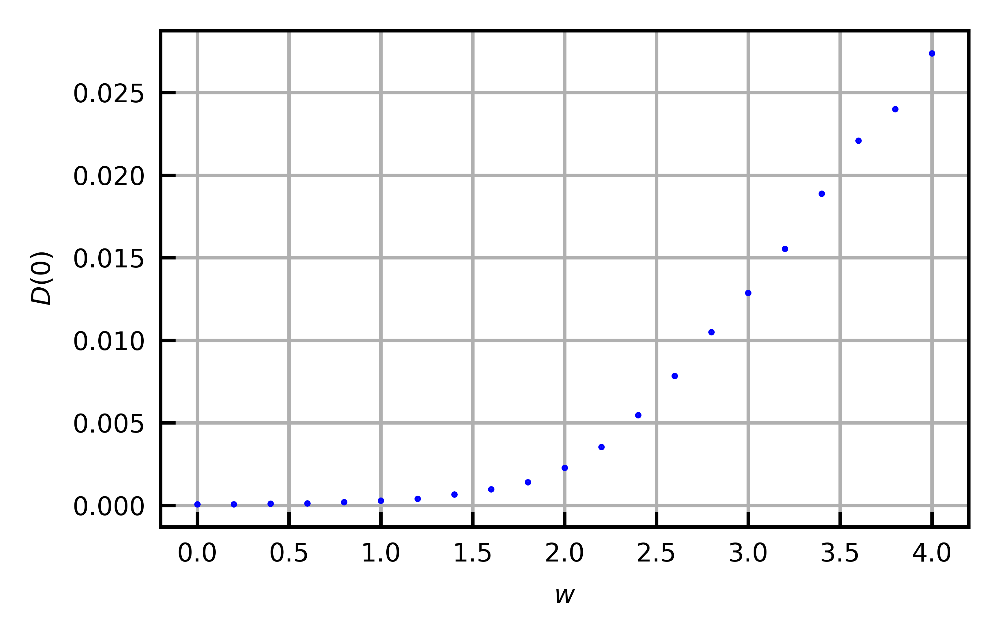

(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)
(43200000,)


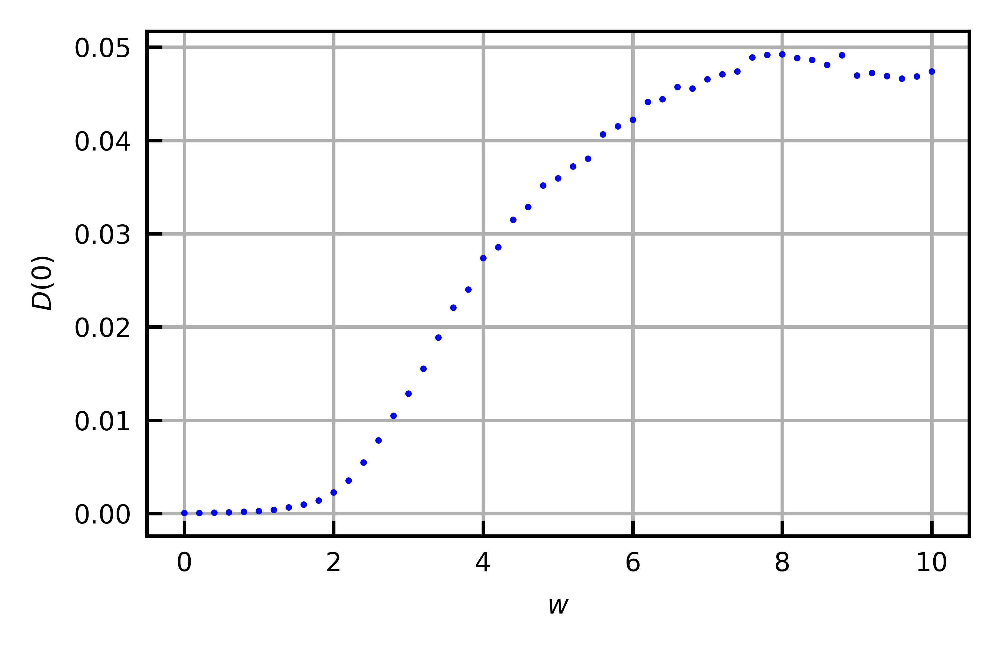

In [3]:
with h5py.File("C:\\Users\\vinic\\Desktop\\Desktop_files\\Master Project\\data\\Physical_spectra_all.h5", "r") as f:
    data = np.array(f["combined_data"])
    print(data.shape)
    for i in range(0, 21):
        w = 0.2*i
        plt.xlabel("$w$")
        plt.ylabel("$D(0)$")
        DOS = calc_DOS(data[i].flatten(), num_bins, plot=False, ky0 = False, ES=False, log=False, density=False, E0 = False)
        plt.plot(w, (DOS[1]/np.sum(DOS[1]))[len(DOS[1])//2], ".", color="blue", markersize=1, linestyle="")
    plt.show()

    for i in range(0, 51):
        w = 0.2*i
        plt.xlabel("$w$")
        plt.ylabel("$D(0)$")
        DOS = calc_DOS(data[i].flatten(), num_bins, plot=False, ky0 = False, ES=False, log=False, density=False, E0 = False)
        plt.plot(w, (DOS[1]/np.sum(DOS[1]))[len(DOS[1])//2], ".", color="blue", markersize=1, linestyle="")
    plt.show()

fast
Hamiltonian built in (fast) 8.020469665527344


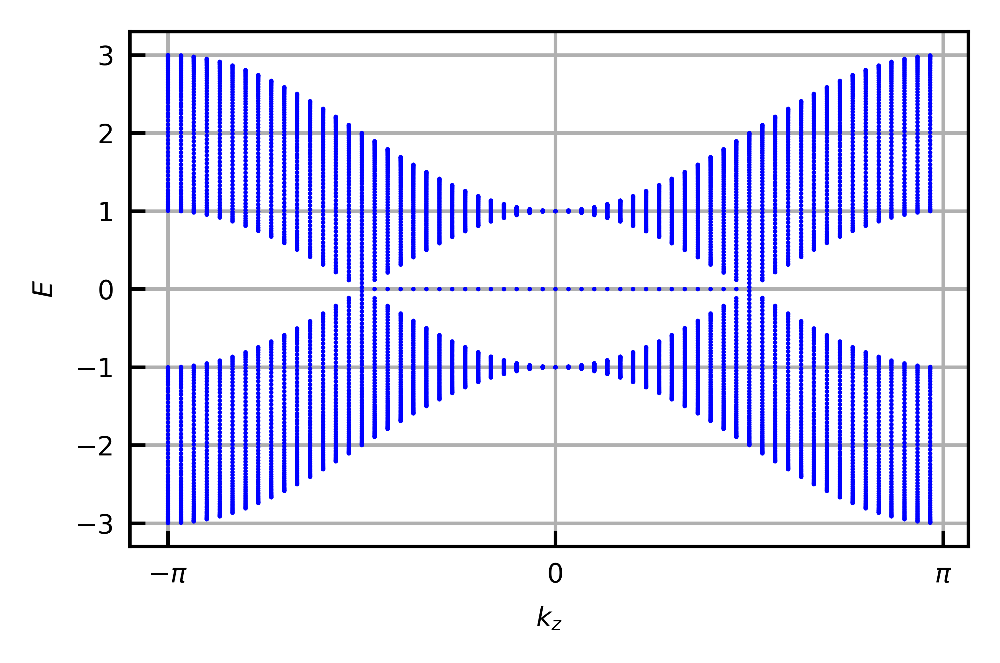

In [6]:
H = Hamiltonian(L, "yz", t_z, t, t_0, m_z, k_z, w=0, disorder=disorder, Fourier=True, fast=True)
eigvals = np.linalg.eigvalsh(H)
vals = eigvals[::N]
vals = np.concatenate((vals[N//2:], vals[:N//2]), axis=0)

plt.plot(np.arange(-np.pi, np.pi, 2*np.pi/N), vals, marker=".", markersize=2, markeredgewidth=0, linestyle="", color="blue")
plt.xlabel("$k_z$")
plt.ylabel("$E$")
plt.xticks(ticks=[-np.pi, 0, np.pi], labels=['$-\pi$', '0', '$\pi$'])
plt.show()